**<h1><font color='green'> Ground Water Hand Pump Status Prediction**

In [1]:
# Necessary Installations
!pip install catboost

# Necessary library imports
# Python related
import warnings
warnings.filterwarnings("ignore")
import random
import gdown
from tqdm import tqdm
import joblib
# Data Processing
import numpy as np
import pandas as pd
from pandas.plotting import parallel_coordinates
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", 200)
# Graphing and plotting
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import folium
from folium.plugins import FastMarkerCluster
from IPython.display import display
# Machine Learning
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import scipy
from scipy.sparse import hstack
from sklearn.metrics import accuracy_score, f1_score, log_loss
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import SGDClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report
from prettytable import PrettyTable

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 1.1 MB/s 


# <font color='orange'>1. Understanding the Problem

##<font color='brown'> 1.1 Problem Description

**Description**

Using data from Taarifa and the Tanzanian Ministry of Water, can we predict which pumps are functional, which need some repairs, and which don't work at all, based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.

**Problem Statement**

Our objective here is to predict one of the three classes representing the hand pump status based on a number of variables that give the information about the waterpoint. 

**Source:** https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/23/ 

##<font color='brown'>1.2 Useful Links

**Data Source:** https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/23/

**Research Paper:** https://cs229.stanford.edu/proj2018/report/106.pdf  

##<font color='brown'>1.3 Real World / Business Objectives and Constraints

1. Predict pump status with high precision and recall.
2. Incorrect prediction could impact pumps maintenance management.
3. No strict latency constraints.

# <font color='orange'>2. Machine Learning Problem

##<font color='brown'>2.1 About Data

###2.1.1 Data Overview

**Data Source:** https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/23/

Data is in 3 files-
1. train.csv
2. train_labels.csv
3. test.csv

<pre>
<b>train.csv :</b>
has 59400 rows
size is 19.1 MB 
Contains 40 columns with all the information about waterpoints

<b>train_labels.csv :</b>
has 59400 rows
size is 1.1 MB 
Contains 2 columns 'id' and 'status_group'

<b>test.csv :</b>
has 14851 rows
size is 4.8 MB 
Contains 40 columns with all the information about waterpoints
</pre>

**Data Fields Information:**

Data has 40 columns which represent the following set of information about the waterpoints:

<pre>
<b>id</b>- unique waterpoint record id
<b>amount_tsh</b> - Total static head (amount water available to waterpoint)
<b>date_recorded</b> - The date the row was entered
<b>funder</b> - Who funded the well
<b>gps_height</b> - Altitude of the well
<b>installer</b> - Organization that installed the well
<b>longitude</b> - GPS coordinate
<b>latitude</b> - GPS coordinate
<b>wpt_name</b> - Name of the waterpoint if there is one
<b>num_private</b> -
<b>basin</b> - Geographic water basin
<b>subvillage</b> - Geographic location
<b>region</b> - Geographic location
<b>region_code</b> - Geographic location (coded)
<b>district_code</b> - Geographic location (coded)
<b>lga</b> - Geographic location
<b>ward</b> - Geographic location
<b>population</b> - Population around the well
<b>public_meeting</b> - True/False
<b>recorded_by</b> - Group entering this row of data
<b>scheme_management</b> - Who operates the waterpoint
<b>scheme_name</b> - Who operates the waterpoint
<b>permit</b> - If the waterpoint is permitted
<b>construction_year</b> - Year the waterpoint was constructed
<b>extraction_type</b> - The kind of extraction the waterpoint uses
<b>extraction_type_group</b> - The kind of extraction the waterpoint uses
<b>extraction_type_class</b> - The kind of extraction the waterpoint uses
<b>management</b> - How the waterpoint is managed
<b>management_group</b> - How the waterpoint is managed
<b>payment</b> - What the water costs
<b>payment_type</b> - What the water costs
<b>water_quality</b> - The quality of the water
<b>quality_group</b> - The quality of the water
<b>quantity</b> - The quantity of water
<b>quantity_group</b> - The quantity of water
<b>source</b> - The source of the water
<b>source_type</b> - The source of the water
<b>source_class</b> - The source of the water
<b>waterpoint_type</b> - The kind of waterpoint
<b>waterpoint_type_group</b> - The kind of waterpoint
</pre>



__Label Information__

The labels in this dataset are simple. There are three possible values:

<pre>
<b>functional</b> - the waterpoint is operational and there are no repairs needed
<b>functional needs repair</b> - the waterpoint is operational, but needs repairs
<b>non functional</b> - the waterpoint is not operational
</pre>

###2.1.2 Data Point sample

For example, a single row in the dataset might have these values:

<pre>
<b>id : 111 </b>
<b>amount_tsh</b> :	300.0
<b>date_recorded</b> :	2013-02-26
<b>funder</b> :	Germany Republi
<b>gps_height</b> :	1335
<b>installer</b> :	CES
<b>longitude</b> :	37.2029845
<b>latitude</b> :	-3.22870286
<b>wpt_name</b> :	Kwaa Hassan Ismail
<b>num_private</b> :	0
<b>basin</b> :	Pangani
<b>subvillage</b> :	Bwani
<b>region</b> :	Kilimanjaro
<b>region_code</b> :	3
<b>district_code</b> :	5
<b>lga</b> :	Hai
<b>ward</b> :	Machame Uroki
<b>population</b> :	25
<b>public_meeting</b> :	True
<b>recorded_by</b> :	GeoData Consultants Ltd
<b>scheme_management</b> :	Water Board
<b>scheme_name</b> :	Uroki-Bomang'ombe water sup
<b>permit</b> :	True
<b>construction_year</b> :	1995
<b>extraction_type</b> :	gravity
<b>extraction_type_group</b> :	gravity
<b>extraction_type_class</b> :	gravity
<b>management</b> :	water board
<b>management_group</b> :	user-group
<b>payment</b> :	other
<b>payment_type</b> :	other
<b>water_quality</b> :	soft
<b>quality_group</b> :	good
<b>quantity</b> :	enough
<b>quantity_group</b> :	enough
<b>source</b> :	spring
<b>source_type</b> :	spring
<b>source_class</b> :	groundwater
<b>waterpoint_type</b> :	communal standpipe
<b>waterpoint_type_group</b> :	communal standpipe 

<b>status_group</b> : functional (label) </pre>

##<font color='brown'>2.2 Mapping Real World Problem to Machine Learning Problem

###2.2.1 Type Of ML Problem

It is a <b>Multi-Class Classification</b> problem.

Reference: https://scikit-learn.org/stable/modules/multiclass.html 



### 2.2.2 Performance Metrics

<b>Micro f1 score: </b><br>
Calculate metrics globally by counting the total true positives, false negatives and false positives. This is a better metric when we have class imbalance.

<b>Log-loss:</b><br>
Computes how different the actual and predicted class labels are, it is useful for comparing different models.

We want our models to show best performance on test data without overfitting.


# <font color='orange'>3. Exploratory Data Analysis (EDA) 

##<font color='brown'>3.1 Loading Data</font>

###3.1.1 Downloading data using gdown

In [2]:
# Downloading data using gdown
!gdown 1HwXjx-eubi_aQJoZXBTEw527sgrOO1Gx # train_csv
!gdown 18SeMBB0xEcnx81JdA5fMlk82U40Z8TyP # train_labels
!gdown 1QX8G7PnK6F5teCSmUN-9Vm8TFhkVCOyW # test_csv

Downloading...
From: https://drive.google.com/uc?id=1HwXjx-eubi_aQJoZXBTEw527sgrOO1Gx
To: /content/train.csv.csv
100% 20.1M/20.1M [00:00<00:00, 23.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=18SeMBB0xEcnx81JdA5fMlk82U40Z8TyP
To: /content/train_labels.csv.csv
100% 1.15M/1.15M [00:00<00:00, 96.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1QX8G7PnK6F5teCSmUN-9Vm8TFhkVCOyW
To: /content/test.csv.csv
100% 5.02M/5.02M [00:00<00:00, 48.1MB/s]


###3.1.2 Creating train_df by joining train data and train labels

In [3]:
# Joining train_data and labels on id
train_labels = pd.read_csv("/content/train_labels.csv.csv")
train_data = pd.read_csv("/content/train.csv.csv")
train_df = pd.merge(train_data, train_labels, how='inner',
                    on='id')

print("Data frame sample with 2 rows:")
train_df.head(2)

Data frame sample with 2 rows:


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


##<font color='brown'>3.2 Check duplicate data points</font>

In [ ]:
# Checkig duplicate data points in the train_df
duplicates_count = train_df.duplicated(keep='first').sum()
print(f"No. of duplicate data point: {duplicates_count}")
print(f"No. of total data points: {len(train_df)}")
print(f"Percentage of duplicate data points: {duplicates_count*100/len(train_df)} %")

No. of duplicate data point: 0
No. of total data points: 59400
Percentage of duplicate data points: 0.0 %


__Observation(s)__: There are no duplicate data points in the train data.

##<font color='brown'>3.3 Check labels distribution</font>

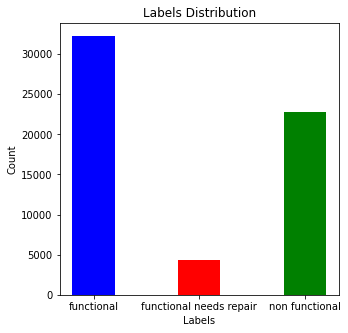

No of points with label 'functional': 32259 (54.31%)
No of points with label 'functional needs repair': 4317 (7.27%)
No of points with label 'non functional': 22824 (38.42%)


In [ ]:
# Check labels distribution
values, counts = np.unique(train_df['status_group'].values, return_counts=True)

# Plot bar chart
fig = plt.figure(figsize=(5,5))
plt.bar(values, counts, width = 0.4, color=['blue', 'red', 'green'])
plt.xlabel("Labels")
plt.ylabel("Count")
plt.title("Labels Distribution")
plt.show()

# Print counts
for i in range(3):
    print(f"No of points with label '{values[i]}': {counts[i]} ({np.round(counts[i]*100/len(train_df),2)}%)")

__Obesrvation(s)__: The data is highly imbalanced.

##<font color='brown'>3.4 Analyzing Numerical Features</font>

###3.4.1 Numerical Features List

In [4]:
numerical_cols = train_df.select_dtypes(include = ['int', 'Int64', 'float']).columns.tolist()
print("Numerical features list:")
print(numerical_cols)

Numerical features list:
['id', 'amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year']


###3.4.2 Numerical Data Quality Report

In [ ]:
# Defining custom functon for data quality report

def get_numerical_dqr(numerical_columns: list, data: pd.DataFrame) -> pd.DataFrame:
    '''
    This Function returns the Data Quality Report of all the Numerical Features in the Data
    in the form of pd.DataFrame
    '''
    #Initializing dqr columns
    d_types = []
    counts = []
    unique_values = []
    missing_values = []
    missing_percent = []
    mean_values = []
    min_values = []
    first_quant = []
    median_values = []
    third_quant = []
    max_values = []

    for col in numerical_columns:
        
        # Data type
        dtype = str(data[col].dtypes)
        d_types.append(dtype)

        # Count
        cnt = data[col].count()
        counts.append(cnt)

        # Unique values
        uval = np.unique(data[col].values)
        unique_values.append(len(uval))

        # Missing_values and percentage
        mval = data[col].isnull().sum()
        missing_values.append(mval)
        missing_percent.append(np.round(mval*100/len(data[col].values), 2))

        # Mean
        avg = data[col].mean()
        mean_values.append(avg)

        # Minimum
        min = data[col].min()
        min_values.append(min)

        # 1st quantile
        q1 = data[col].quantile(q=0.25)
        first_quant.append(q1)

        # Median
        med = data[col].median()
        median_values.append(med)

        # 3rd quantile
        q3 = data[col].quantile(q=0.75)
        third_quant.append(q3)

        # Maximum
        max = data[col].max()
        max_values.append(max)

    dqr_df = pd.DataFrame({
                        "Feature Name": numerical_columns,
                        "Data Type": d_types,
                        "Records": counts,
                        "Unique Values": unique_values,
                        "Missing Values": missing_values,
                        "Missing Percentage": missing_percent,
                        "Mean Value" : mean_values,
                        "Minimun Value": min_values,
                        "1st Quantile Value" : first_quant,
                        "Median Value": median_values,
                        "3rd Quantile Value": third_quant,
                        "Maximum Value": max_values,
                         })     

    return dqr_df

In [ ]:
# Print Numerical Data quanlity
numerical_dqr = get_numerical_dqr(numerical_cols, train_df)
numerical_dqr

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
0,id,int64,59400,59400,0,0.0,37115.131768,0.00000,18519.750000,37061.500000,55656.500000,7.424700e+04
1,amount_tsh,float64,59400,98,0,0.0,317.650385,0.00000,0.000000,0.000000,20.000000,3.500000e+05
2,gps_height,int64,59400,2428,0,0.0,668.297239,-90.00000,0.000000,369.000000,1319.250000,2.770000e+03
3,longitude,float64,59400,57516,0,0.0,34.077427,0.00000,33.090347,34.908743,37.178387,4.034519e+01
4,latitude,float64,59400,57517,0,0.0,-5.706033,-11.64944,-8.540621,-5.021597,-3.326156,-2.000000e-08
5,num_private,int64,59400,65,0,0.0,0.474141,0.00000,0.000000,0.000000,0.000000,1.776000e+03
6,region_code,int64,59400,27,0,0.0,15.297003,1.00000,5.000000,12.000000,17.000000,9.900000e+01
7,district_code,int64,59400,20,0,0.0,5.629747,0.00000,2.000000,3.000000,5.000000,8.000000e+01
8,population,int64,59400,1049,0,0.0,179.909983,0.00000,0.000000,25.000000,215.000000,3.050000e+04
9,construction_year,int64,59400,55,0,0.0,1300.652475,0.00000,0.000000,1986.000000,2004.000000,2.013000e+03


In [ ]:
tmp = train_df.loc[train_df['construction_year'] > 0]
tmp_med = tmp['construction_year'].median()
print(f"Median non zero construction_year: {tmp_med}")

Median non zero construction_year: 2000.0


__Observation(s)__: From above report we can get following insights-

1. amount_tsh has more than 50% values as 0
2. gps_height min value is -90 which is not possible since Tanzania is above sea level and has positive altitude values
3. longitude of 0 does not exist in Tanzania, unknown values might be entered as 0
4. num_private has a lot of values as 0, mean is around 0 and max value is 1776 so there is uncertainty about this feature
5. region_code, district_code, construction_year should be categorical features
6. construction year has 25% values as 0 which is not possible, unknown values might be entered as zero

In [ ]:
# Convert features with wrong data types to categorical features
train_df_mod1 = train_df.copy()
train_df_mod1[['region_code', 'district_code', 'construction_year']] = train_df_mod1[['region_code','district_code', 'construction_year']].astype('object')

### 3.4.3 Individual Numerical Featurewise EDA

In [ ]:
# Defining necessary functions

def plot_hist(data: pd.DataFrame, column_name: str, bins: int=20):
    """
    This function plots histogram for given numerical feature based on the dataset
    """
    
    fig = plt.figure(figsize=(10,10))
    data.hist(column_name, bins=bins)
    plt.title(f"Distribution of {column_name}")
    plt.xlabel(f"{column_name}")
    plt.ylabel("Count")
    plt.show()

def check_distribution(data: pd.DataFrame, column_name: str):
    """
    This function returns distribution of column_name feature with respect to the labels.
    """
    group_df = data.groupby([column_name, 'status_group'])['id'].count().reset_index()
    pivot = group_df.pivot_table(index = column_name, columns = 'status_group', fill_value = 0)
    cols = pivot.columns.tolist()
    ind = pd.Index([ str(e[1])  for e in cols])
    pivot.columns = ind
    pivot['total_pumps'] = pivot['functional'] +pivot['functional needs repair'] +pivot['non functional']
    pivot['all_pumps'] = pivot['total_pumps'].sum()
    pivot['total_pumps_%'] =((pivot['total_pumps']/pivot['all_pumps'])*100).round(1)
    pivot['functional_pumps_%'] = ((pivot['functional']/pivot['total_pumps'])*100).round(1)
    pivot['non_functional_pumps_%'] = ((pivot['non functional']/pivot['total_pumps'])*100).round(1)
    pivot['functional_needs_repair_pumps_%'] = ((pivot['functional needs repair']/pivot['total_pumps'])*100).round(1)
    pivot = pivot.drop(['functional', 'functional needs repair', 'non functional', 'all_pumps'], axis=1)
    return pivot

__(A) amount_tsh__ :



In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='amount_tsh']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
1,amount_tsh,float64,59400,98,0,0.0,317.650385,0.0,0.0,0.0,20.0,350000.0


In [ ]:
# Checking amount_tsh feature
amount_tsh_disb = check_distribution(train_df, 'amount_tsh')
amount_tsh_disb.head(10)

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
amount_tsh,,,,,
0.00,41639,70.1,47.3,45.4,7.3
0.20,3,0.0,0.0,100.0,0.0
0.25,1,0.0,100.0,0.0,0.0
1.00,3,0.0,0.0,100.0,0.0
2.00,13,0.0,100.0,0.0,0.0
5.00,376,0.6,87.8,12.2,0.0
6.00,190,0.3,91.6,6.8,1.6
7.00,69,0.1,78.3,21.7,0.0
9.00,1,0.0,0.0,100.0,0.0


<Figure size 720x720 with 0 Axes>

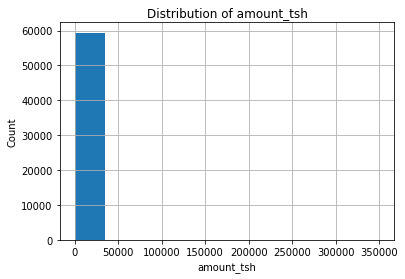

In [ ]:
plot_hist(train_df, 'amount_tsh', 10)

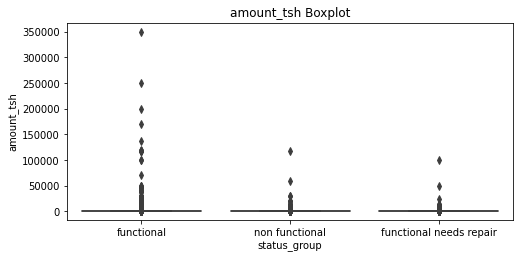

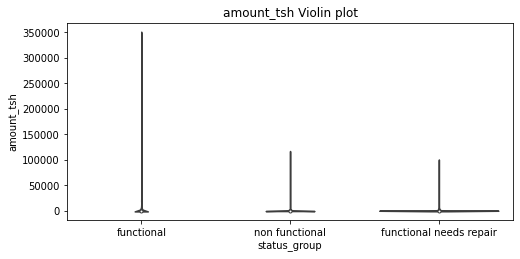

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='amount_tsh', data=train_df)
plt.title("amount_tsh Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='amount_tsh', data=train_df)
plt.title("amount_tsh Violin plot")
plt.show()

__Observation(s)__ :

1. Around 70% records have amount_tsh = 0
2. 0 value for static head doesn't make sense since there is no need to use a hand pump to pump water at static head of 0
3. We can say, missing values are entered as 0
4. Artificially imputing 70% data will be like adding bias
5. This feature could be dropped for model training

__(B) gps_height__ :

In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='gps_height']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
2,gps_height,int64,59400,2428,0,0.0,668.297239,-90.0,0.0,369.0,1319.25,2770.0


In [ ]:
# Checking gps_height feature
gps_height_disb = check_distribution(train_df, 'gps_height')
gps_height_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
gps_height,,,,,
-90,1,0.0,100.0,0.0,0.0
-63,2,0.0,100.0,0.0,0.0
-59,1,0.0,0.0,100.0,0.0
-57,1,0.0,100.0,0.0,0.0
-55,1,0.0,0.0,100.0,0.0
...,...,...,...,...,...
2623,1,0.0,100.0,0.0,0.0
2626,2,0.0,100.0,0.0,0.0
2627,1,0.0,0.0,100.0,0.0


<Figure size 720x720 with 0 Axes>

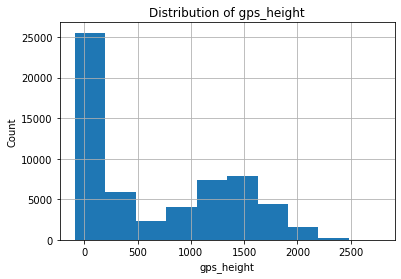

In [ ]:
plot_hist(train_df, 'gps_height', 10)

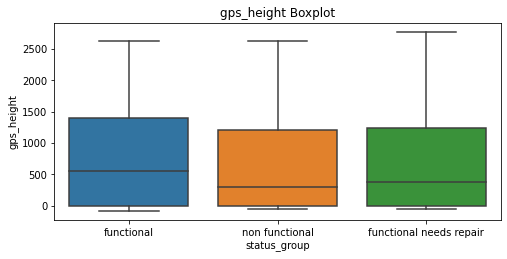

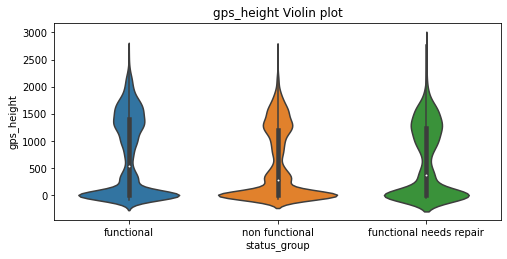

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='gps_height', data=train_df)
plt.title("gps_height Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='gps_height', data=train_df)
plt.title("gps_height Violin plot")
plt.show()

In [ ]:
temp = train_df.loc[train_df['gps_height'] <= 0]
print(f"No. of records with gps_height <= 0 : {temp.shape[0]}", f"({np.round(temp.shape[0]*100/train_df.shape[0],2)} %)")

No. of records with gps_height <= 0 : 21934 (36.93 %)


Text(0.5, 1.0, 'Locations with GPS height <= zero')

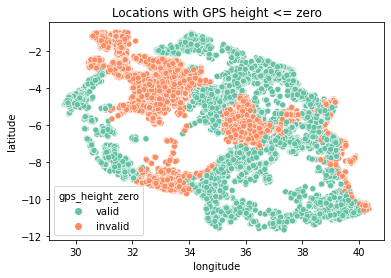

In [ ]:
#plot locations where gps height <= 0
temp = train_df[train_df['longitude']!=0]  #only include records where logitude isn't zero
temp['gps_height_zero'] = np.where(temp['gps_height']<=0, 'invalid', 'valid')
sns.scatterplot(x= temp['longitude'], y = temp['latitude'], hue = temp['gps_height_zero'], palette='Set2')
plt.title('Locations with GPS height <= zero') 

In [ ]:
check_distribution(temp, 'gps_height_zero')

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
gps_height_zero,,,,,
invalid,20122,34.9,51.6,41.4,7.1
valid,37466,65.1,56.1,37.2,6.7


__Observation(s)__ :

1. Around 37% points have gps_height <= 0, which is not possible since Tanzania is located above sea level
2. There is not much difference between distribution of valid amd invalid gps_height points

__(C) longitude and latitude__ :

In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='latitude']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
4,latitude,float64,59400,57517,0,0.0,-5.706033,-11.64944,-8.540621,-5.021597,-3.326156,-2.000000e-08


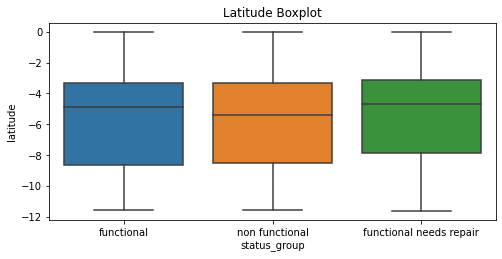

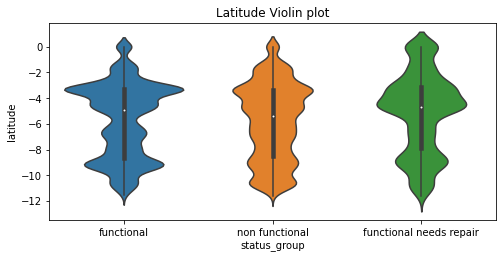

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='latitude', data=train_df)
plt.title("Latitude Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='latitude', data=train_df)
plt.title("Latitude Violin plot")
plt.show()

In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='longitude']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
3,longitude,float64,59400,57516,0,0.0,34.077427,0.0,33.090347,34.908743,37.178387,40.345193


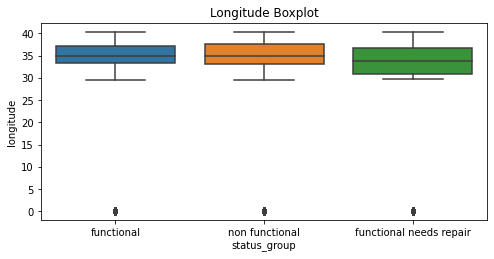

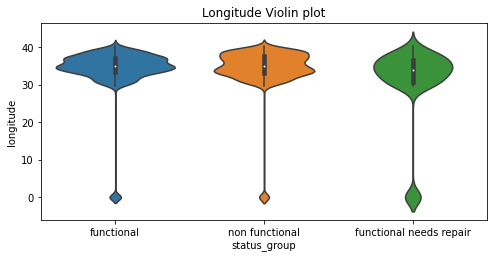

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='longitude', data=train_df)
plt.title("Longitude Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='longitude', data=train_df)
plt.title("Longitude Violin plot")
plt.show()

In [ ]:
# Plot waterpoints locations
#https://stackoverflow.com/questions/49984575/is-there-a-limit-to-plotting-markers-with-folium
temp = train_df.copy()
map = folium.Map(location=[temp['latitude'].mean(), temp['longitude'].mean()], zoom_start=6)
# for id, row in train_df.iterrows():
#     folium.Marker([row['latitude'], row['longitude']], popup=row['wpt_name']).add_to(map)
map.add_child(FastMarkerCluster(temp[['latitude', 'longitude']].values.tolist()))
map.save("map.html")

In [ ]:
#display(map)

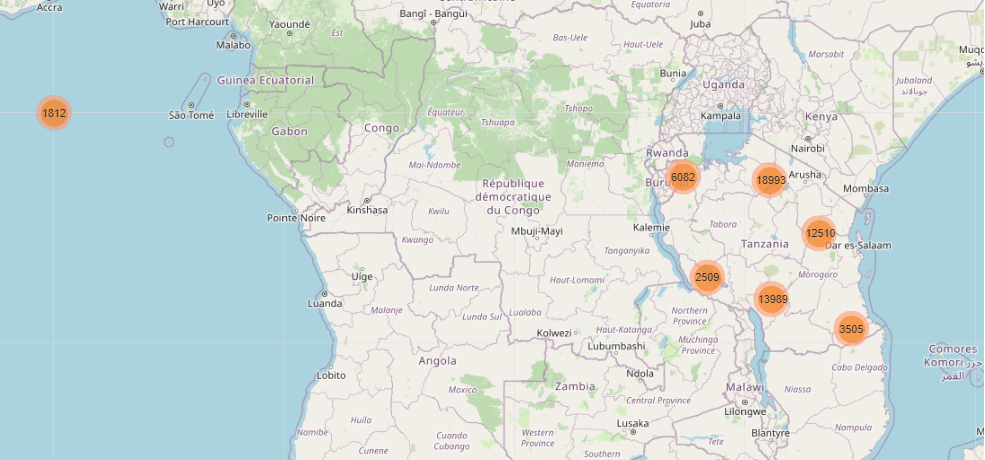

__Observation(s)__ :

1. Some points are located in the south atlantic ocean which can't be possible
2. Tanzania latitude range: -11.8 to -2.00
3. Tanzania longitude range: 28 to 40.8
4. Points outside these ranges are outliers and can be deleted from the data 

__(D) num_private :__

In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='num_private']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
5,num_private,int64,59400,65,0,0.0,0.474141,0.0,0.0,0.0,0.0,1776.0


In [ ]:
# Checking num_private feature
num_private_disb = check_distribution(train_df, 'num_private')
num_private_disb.head(10)

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
num_private,,,,,
0,58643,98.7,54.2,38.5,7.3
1,73,0.1,54.8,37.0,8.2
2,23,0.0,60.9,39.1,0.0
3,27,0.0,44.4,44.4,11.1
4,20,0.0,45.0,55.0,0.0
5,46,0.1,67.4,32.6,0.0
6,81,0.1,67.9,24.7,7.4
7,26,0.0,57.7,38.5,3.8
8,46,0.1,67.4,15.2,17.4


<Figure size 720x720 with 0 Axes>

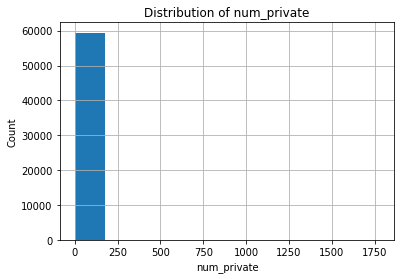

In [ ]:
plot_hist(train_df, 'num_private', 10)

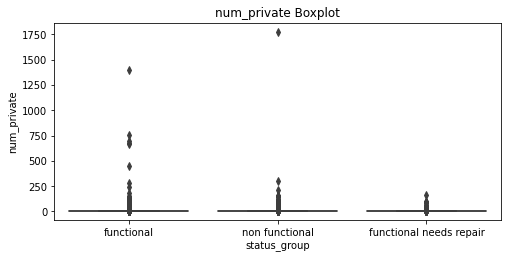

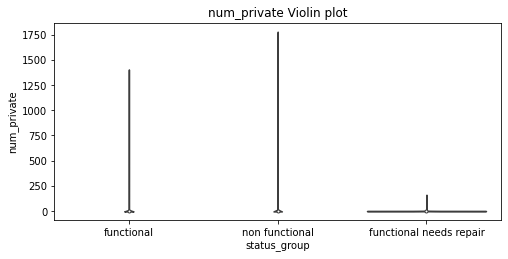

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='num_private', data=train_df)
plt.title("num_private Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='num_private', data=train_df)
plt.title("num_private Violin plot")
plt.show()

__Observation(s):__

1. Around 98.7% records have num_private value as 0
2. Also there is no information about definition of this feature 

__(E) population :__ 

In [ ]:
numerical_dqr.loc[numerical_dqr['Feature Name']=='population']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mean Value,Minimun Value,1st Quantile Value,Median Value,3rd Quantile Value,Maximum Value
8,population,int64,59400,1049,0,0.0,179.909983,0.0,0.0,25.0,215.0,30500.0


In [ ]:
# Checking population feature
population_disb = check_distribution(train_df, 'population')
population_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
population,,,,,
0,21381,36.0,52.7,39.0,8.3
1,7025,11.8,41.4,53.5,5.0
2,4,0.0,75.0,25.0,0.0
3,4,0.0,75.0,25.0,0.0
4,13,0.0,69.2,30.8,0.0
...,...,...,...,...,...
9865,1,0.0,0.0,100.0,0.0
10000,3,0.0,100.0,0.0,0.0
11463,1,0.0,100.0,0.0,0.0


<Figure size 720x720 with 0 Axes>

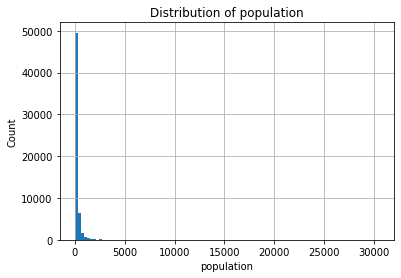

In [ ]:
plot_hist(train_df, 'population', 100)

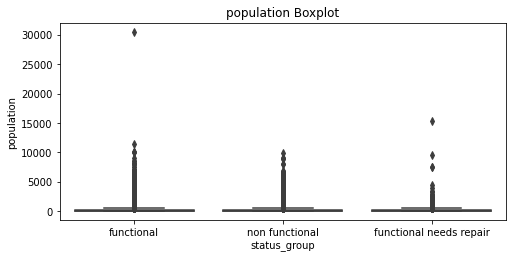

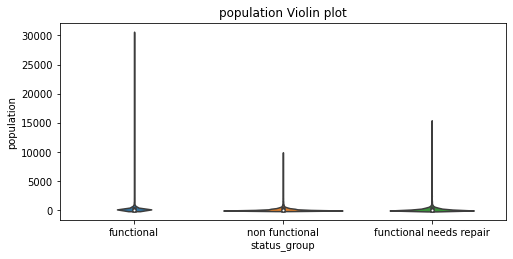

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
bp = sns.boxplot(x='status_group', y='population', data=train_df)
plt.title("population Boxplot")

plt.figure(figsize=(8,8))
plt.subplot(2,1,2)
vp = sns.violinplot(x='status_group', y='population', data=train_df)
plt.title("population Violin plot")
plt.show()

__Observation(s)__ :

1. Around 36% records have 0 population
2. There is lot of variance in the population distribution 0 to 30500
3. This feature might not add much significance to the model

##<font color='brown'>3.5 Analyzing categorical features</font>

###3.5.1 Get Categorical Features List

In [ ]:
categorical_cols = train_df_mod1.select_dtypes(include = ['object']).columns.tolist()
# Removing date and target label
categorical_cols.remove('date_recorded')
categorical_cols.remove('status_group')
print("Categorical features list:")
print(categorical_cols)

Categorical features list:
['funder', 'installer', 'wpt_name', 'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga', 'ward', 'public_meeting', 'recorded_by', 'scheme_management', 'scheme_name', 'permit', 'construction_year', 'extraction_type', 'extraction_type_group', 'extraction_type_class', 'management', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'quantity_group', 'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group']


###3.5.2 Categorical feature Data Quality Report

In [ ]:
# Defining custom functon for data quality report

def get_categorical_dqr(categorical_columns: list, data: pd.DataFrame) -> pd.DataFrame:
    '''
    This Function returns the Data Quality Report of all the Categorical Features in the Data
    in the form of pd.DataFrame
    '''
    #Initializing dqr columns
    d_types = []
    counts = []
    unique_values = []
    missing_values = []
    missing_percent = []
    mode_values = []
    mode_freq = []
    mode_percent = []

    for col in categorical_columns:
        
        # Data type
        dtype = str(data[col].dtypes)
        d_types.append(dtype)

        # Count
        cnt = data[col].count()
        counts.append(cnt)

        # Unique values
        uval = pd.unique(data[col])
        unique_values.append(len(uval))

        # Missing_values and percentage
        mval = data[col].isnull().sum()
        missing_values.append(mval)
        missing_percent.append(np.round(mval*100/len(data[col].values), 2))

        # Mode
        mod = data[col].mode()[0]
        mode_values.append(mod)

        # Mode Frequency
        c = data[col].value_counts()
        mode_f = max(c)
        mode_freq.append(mode_f)

        # Mode percentage
        mp = np.round(mode_f*100/cnt, 2)
        mode_percent.append(mp)

    dqr_df = pd.DataFrame({
                        "Feature Name": categorical_columns,
                        "Data Type": d_types,
                        "Records": counts,
                        "Unique Values": unique_values,
                        "Missing Values": missing_values,
                        "Missing Percentage": missing_percent,
                        "Mode Value" : mode_values,
                        "Mode Frequency": mode_freq,
                        "Mode Percent" : mode_percent,
                         })     

    return dqr_df

In [ ]:
# Print categorical Data quality
categorical_dqr = get_categorical_dqr(categorical_cols, train_df)
categorical_dqr

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
0,funder,object,55765,1898,3635,6.12,Government Of Tanzania,9084,16.29
1,installer,object,55745,2146,3655,6.15,DWE,17402,31.22
2,wpt_name,object,59400,37400,0,0.00,none,3563,6.00
3,basin,object,59400,9,0,0.00,Lake Victoria,10248,17.25
4,subvillage,object,59029,19288,371,0.62,Madukani,508,0.86
5,region,object,59400,21,0,0.00,Iringa,5294,8.91
6,region_code,int64,59400,27,0,0.00,11,5300,8.92
7,district_code,int64,59400,20,0,0.00,1,12203,20.54
8,lga,object,59400,125,0,0.00,Njombe,2503,4.21
9,ward,object,59400,2092,0,0.00,Igosi,307,0.52


__Observation(s)__: From above report we can get following insights-

1. recorded_by has single value for all records hence it is not useful for model building
2. funder, installer, wpt_name, subvillage, ward, scheme_name features have very high cardinality which may increase dimesionality of the data
3. scheme_name has around 47% missing values
4. construction_year has around 35% values as 0
5. some set of features capture same information on diffrent granularity level 

###3.5.3 Individual Categorical feature wise EDA

**Features funder, installer, wpt_name, subvillage, ward, scheme_name have very high cardinality hence will not be useful for model building. Other categorical features can be analyzed.**

__(1) basin :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='basin']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
3,basin,object,59400,9,0,0.0,Lake Victoria,10248,17.25


In [ ]:
# Checking basin feature
basin_disb = check_distribution(train_df, 'basin')
basin_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
basin,,,,,
Internal,7785,13.1,57.6,35.3,7.2
Lake Nyasa,5085,8.6,65.4,29.7,4.9
Lake Rukwa,2454,4.1,40.7,48.2,11.0
Lake Tanganyika,6432,10.8,48.3,40.2,11.5
Lake Victoria,10248,17.3,49.8,40.6,9.7
Pangani,8940,15.1,60.1,34.6,5.3
Rufiji,7976,13.4,63.5,31.0,5.5
Ruvuma / Southern Coast,4493,7.6,37.2,55.6,7.3
Wami / Ruvu,5987,10.1,52.4,43.1,4.5


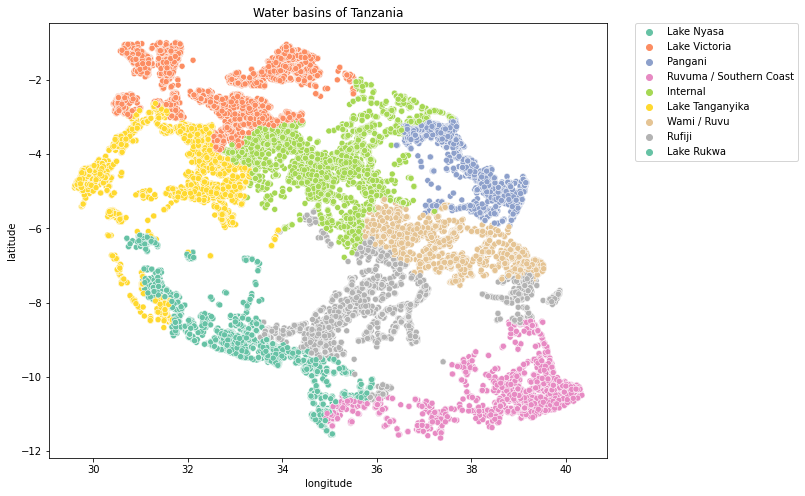

In [ ]:
# Plot basins
fig, axes = plt.subplots(figsize=(10,8))
temp = train_df[train_df['longitude']!=0]  #only include records where logitude isn't zero
ax = sns.scatterplot(x= temp['longitude'], y = temp['latitude'], hue = temp['basin'], palette='Set2')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set(title = 'Water basins of Tanzania')
plt.show()

__(2) region :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='region']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
5,region,object,59400,21,0,0.0,Iringa,5294,8.91


In [ ]:
# Checking region feature
region_disb = check_distribution(train_df, 'region')
region_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
region,,,,,
Arusha,3350,5.6,68.5,26.3,5.2
Dar es Salaam,805,1.4,57.3,42.4,0.4
Dodoma,2201,3.7,45.8,44.7,9.5
Iringa,5294,8.9,78.2,19.5,2.3
Kagera,3316,5.6,52.1,38.8,9.2
Kigoma,2816,4.7,48.4,30.2,21.4
Kilimanjaro,4379,7.4,60.3,32.4,7.4
Lindi,1546,2.6,29.8,64.2,6.0
Manyara,1583,2.7,62.3,31.6,6.1


In [ ]:
m = folium.Map(location=[-6.77, 35.75], zoom_start=6)
state_geo = f"https://raw.githubusercontent.com/thadk/GeoTZ/499a496581977655d3ff50ff10e1676f4d69fdb9/TZA_adm1_mkoaTZ.geojson"
folium.Choropleth(
    geo_data=state_geo,
    data=region_disb,
    columns=[region_disb.index,"non_functional_pumps_%"],
    key_on="properties.NAME_1",
    fill_color="Greens",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="Functional need repair (%)",
    reset=True,
).add_to(m)

folium.LayerControl().add_to(m)
#m

Functional Pumps Region Wise Distribution

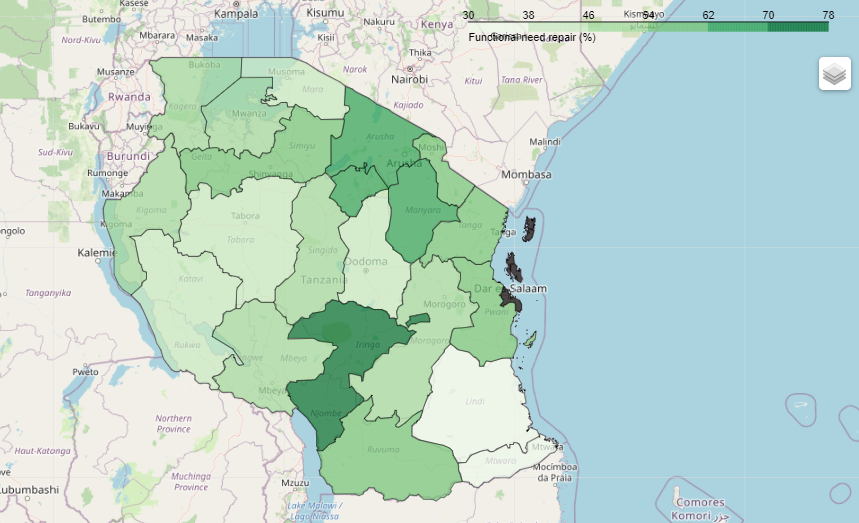

Non Functional Pumps Region wise Distribution

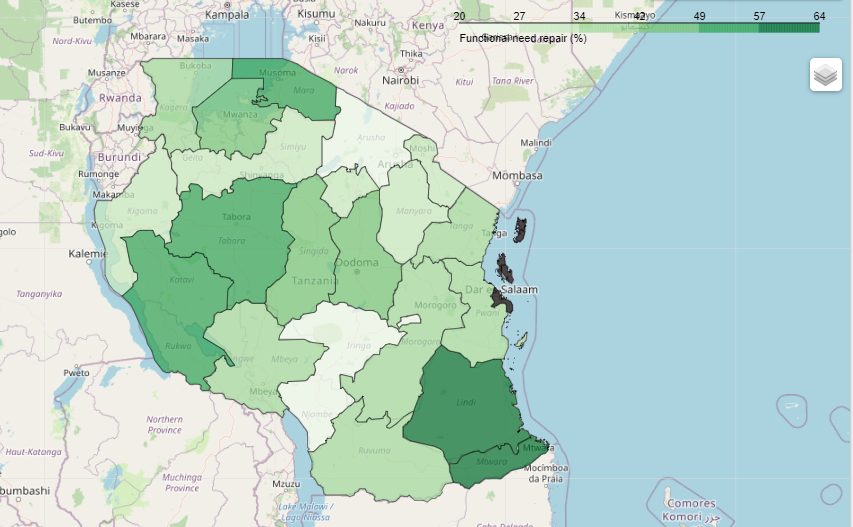

Pumps Needing Repair Region wise Distribution

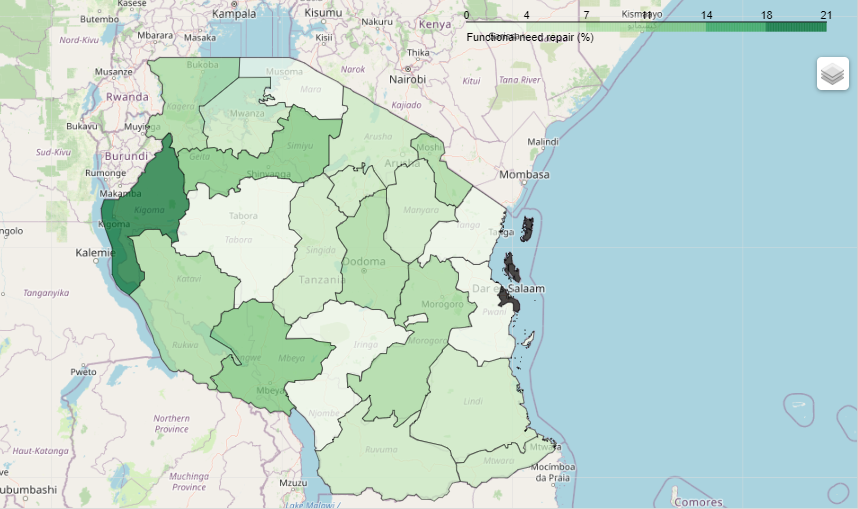

__Observation(s)__ :

Various regions have diffrent distributions of class labels, region could be useful feature for ml model.

__(3) region_code :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='region_code']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
6,region_code,int64,59400,27,0,0.0,11,5300,8.92


In [ ]:
# Checking region_code feature
region_code_disb = check_distribution(train_df, 'region_code')
region_code_disb.head(10)

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
region_code,,,,,
1,2201,3.7,45.8,44.7,9.5
2,3024,5.1,65.4,28.8,5.8
3,4379,7.4,60.3,32.4,7.4
4,2513,4.2,56.0,41.1,2.9
5,4040,6.8,53.1,39.4,7.4
6,1609,2.7,66.3,32.8,1.0
7,805,1.4,57.3,42.4,0.4
8,300,0.5,8.7,86.3,5.0
9,390,0.7,35.6,59.0,5.4


__(4) district_code :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='district_code']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
7,district_code,int64,59400,20,0,0.0,1,12203,20.54


In [ ]:
# Checking district_code feature
district_code_disb = check_distribution(train_df, 'district_code')
district_code_disb.head(10)

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
district_code,,,,,
0,23,0.0,17.4,73.9,8.7
1,12203,20.5,53.7,35.7,10.5
2,11173,18.8,55.5,36.9,7.6
3,9998,16.8,49.5,43.5,7.0
4,8999,15.1,62.2,32.2,5.7
5,4356,7.3,56.9,38.6,4.5
6,4074,6.9,50.4,43.9,5.7
7,3343,5.6,60.2,33.4,6.4
8,1043,1.8,56.5,38.4,5.1


__Observation(s)__:

region, region_code, district_code capture same information at different granularity levels, any one of them could be used.

__(5) lga :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='lga']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
8,lga,object,59400,125,0,0.0,Njombe,2503,4.21


In [ ]:
# Checking lga feature
lga_disb = check_distribution(train_df, 'lga')
lga_disb.head(10)

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
lga,,,,,
Arusha Rural,1252,2.1,69.9,26.3,3.8
Arusha Urban,63,0.1,66.7,22.2,11.1
Babati,511,0.9,74.6,15.1,10.4
Bagamoyo,997,1.7,73.2,26.6,0.2
Bahi,224,0.4,70.5,29.5,0.0
Bariadi,1177,2.0,49.3,16.0,34.7
Biharamulo,403,0.7,68.0,26.8,5.2
Bukoba Rural,487,0.8,46.0,34.1,19.9
Bukoba Urban,88,0.1,52.3,36.4,11.4


__Observation(s)__:

lga has 125 unique values but is showing good distribution among class labels so it could be a useful feature

__(6) public_meeting :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='public_meeting']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
10,public_meeting,object,56066,3,3334,5.61,True,51011,90.98


In [ ]:
# Checking public_meeting feature
public_meeting_disb = check_distribution(train_df, 'public_meeting')
public_meeting_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
public_meeting,,,,,
False,5055,9.0,43.0,48.3,8.7
True,51011,91.0,55.7,37.0,7.3


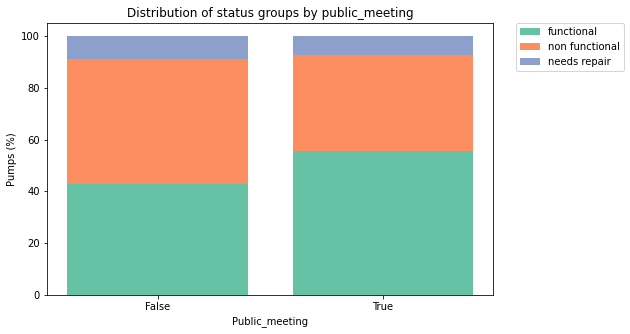

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
labels = ['False', 'True']
ax.bar(labels, public_meeting_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, public_meeting_disb ['non_functional_pumps_%'], label = 'non functional', bottom = public_meeting_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, public_meeting_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = public_meeting_disb['functional_pumps_%'] + public_meeting_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by public_meeting', xlabel = 'Public_meeting', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. 91% records had public meeting and pumps without meeting have comparatively high % of non-functional pumps
2. Around 5% value  are missing which could be imputed smartly using above observation



__(7) scheme_management :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='scheme_management']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
12,scheme_management,object,55523,13,3877,6.53,VWC,36793,66.27


In [ ]:
# Checking scheme_management feature
scheme_management_disb = check_distribution(train_df, 'scheme_management')
scheme_management_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
scheme_management,,,,,
Company,1061,1.9,50.3,46.2,3.5
None,1,0.0,100.0,0.0,0.0
Other,766,1.4,59.8,37.3,2.9
Parastatal,1680,3.0,57.5,30.5,12.0
Private operator,1063,1.9,68.6,29.3,2.2
SWC,97,0.2,20.6,78.4,1.0
Trust,72,0.1,63.9,29.2,6.9
VWC,36793,66.3,51.5,42.1,6.3
WUA,2883,5.2,69.2,22.5,8.3


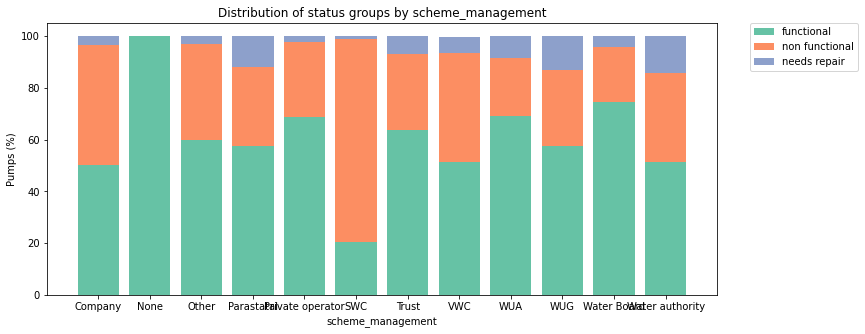

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = scheme_management_disb.index.values
ax.bar(labels, scheme_management_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, scheme_management_disb ['non_functional_pumps_%'], label = 'non functional', bottom = scheme_management_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, scheme_management_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = scheme_management_disb['functional_pumps_%'] + scheme_management_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by scheme_management', xlabel = 'scheme_management', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. scheme_management has 6.5% missing values which could be imputed using mode value
2. it shows good distribution across class labels, hence could be useful feature

__(8) permit :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='permit']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
14,permit,object,56344,3,3056,5.14,True,38852,68.95


In [ ]:
# Checking permit feature
permit_disb = check_distribution(train_df, 'permit')
permit_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
permit,,,,,
False,17492,31.0,51.7,40.7,7.5
True,38852,69.0,55.4,37.6,6.9


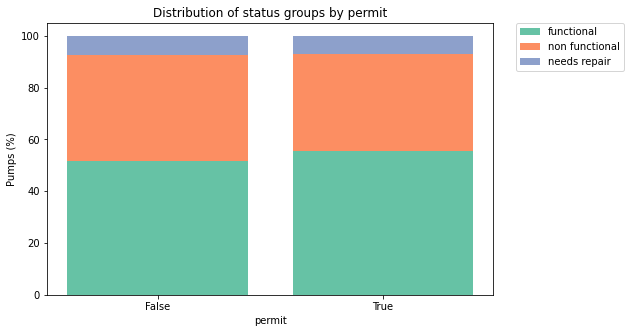

In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
labels = ['False', 'True']
ax.bar(labels, permit_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, permit_disb ['non_functional_pumps_%'], label = 'non functional', bottom = permit_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, permit_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = permit_disb['functional_pumps_%'] + permit_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by permit', xlabel = 'permit', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. permit has around 5.14% missing values which could be imputed 
2. permit shows good distribution across class labels hence it could be a useful feature for ml model

__(9) construction_year :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='construction_year']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
15,construction_year,int64,59400,55,0,0.0,0,20709,34.86


In [ ]:
# Checking construction_year feature
construction_year_disb = check_distribution(train_df, 'construction_year')
construction_year_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
construction_year,,,,,
0,20709,34.9,51.0,40.4,8.6
1960,102,0.2,23.5,70.6,5.9
1961,21,0.0,9.5,76.2,14.3
1962,30,0.1,23.3,73.3,3.3
1963,85,0.1,36.5,56.5,7.1
1964,40,0.1,17.5,80.0,2.5
1965,19,0.0,57.9,36.8,5.3
1966,17,0.0,35.3,64.7,0.0
1967,88,0.1,35.2,45.5,19.3


In [ ]:
temp = construction_year_disb.copy()
temp['total_pumps_%'] = temp['total_pumps_%'].astype('int')
temp_yr = temp.loc[2000:2012]
print(f"Percetage of pumps constructed from 2000 to 2012 = {temp_yr['total_pumps_%'].sum()} %")

Percetage of pumps constructed from 2000 to 2012 = 27 %


__Observation(s) :__

1. Waterpoints constructed earlier have lower % of functional pumps which is a helpful insight
2. 35% records have construction year value as 0 which could be entered as missing value
3. 27% of waterpoints were constructed between 2000 to 2012 which could be useful for data imputation
4. Using features record_date and construction_year new feature useful feature could be contructed

__(10) extraction_type :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='extraction_type']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
16,extraction_type,object,59400,18,0,0.0,gravity,26780,45.08


In [ ]:
# Checking extraction_type feature
extraction_type_disb = check_distribution(train_df, 'extraction_type')
extraction_type_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
extraction_type,,,,,
afridev,1770,3.0,67.8,29.8,2.4
cemo,90,0.2,50.0,40.0,10.0
climax,32,0.1,25.0,75.0,0.0
gravity,26780,45.1,59.9,30.0,10.1
india mark ii,2400,4.0,60.3,36.4,3.3
india mark iii,98,0.2,44.9,54.1,1.0
ksb,1415,2.4,49.7,48.5,1.8
mono,2865,4.8,37.8,57.7,4.5
nira/tanira,8154,13.7,66.5,25.7,7.9


__(11) extraction_type_class :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='extraction_type_class']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
18,extraction_type_class,object,59400,7,0,0.0,gravity,26780,45.08


In [ ]:
# Checking extraction_type_class feature
extraction_type_class_disb = check_distribution(train_df, 'extraction_type_class')
extraction_type_class_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
extraction_type_class,,,,,
gravity,26780,45.1,59.9,30.0,10.1
handpump,16456,27.7,63.0,30.9,6.0
motorpump,2987,5.0,38.0,57.4,4.6
other,6430,10.8,16.0,80.8,3.2
rope pump,451,0.8,65.0,31.3,3.8
submersible,6179,10.4,53.9,42.0,4.1
wind-powered,117,0.2,42.7,51.3,6.0


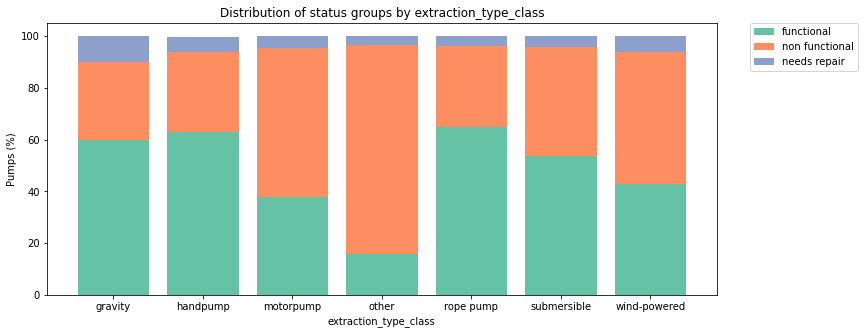

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = extraction_type_class_disb.index.values
ax.bar(labels, extraction_type_class_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, extraction_type_class_disb ['non_functional_pumps_%'], label = 'non functional', bottom = extraction_type_class_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, extraction_type_class_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = extraction_type_class_disb['functional_pumps_%'] + extraction_type_class_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by extraction_type_class', xlabel = 'extraction_type_class', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. extraction_type and extraction_type_class capture same information at diffrent granularity levels
2. extraction_type_class shows better distribution across class labels
3. Any one of them, preferably extraction_type_class could be used for model training

__(12) management :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='management']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
19,management,object,59400,12,0,0.0,vwc,40507,68.19


In [ ]:
# Checking management feature
management_disb = check_distribution(train_df, 'management')
management_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
management,,,,,
company,685,1.2,39.0,58.8,2.2
other,844,1.4,59.8,33.6,6.5
other - school,99,0.2,23.2,75.8,1.0
parastatal,1768,3.0,57.7,30.4,11.9
private operator,1971,3.3,74.9,22.9,2.2
trust,78,0.1,59.0,33.3,7.7
unknown,561,0.9,39.9,55.3,4.8
vwc,40507,68.2,50.4,42.7,6.9
water authority,904,1.5,49.3,44.9,5.8


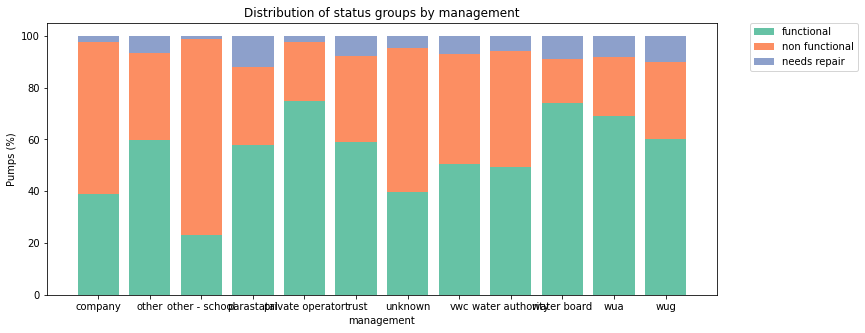

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = management_disb.index.values
ax.bar(labels, management_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, management_disb ['non_functional_pumps_%'], label = 'non functional', bottom = management_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, management_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = management_disb['functional_pumps_%'] + management_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by management', xlabel = 'management', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__(13) management_group :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='management_group']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
20,management_group,object,59400,5,0,0.0,user-group,52490,88.37


In [ ]:
# Checking management_group feature
management_group_disb = check_distribution(train_df, 'management_group')
management_group_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
management_group,,,,,
commercial,3638,6.1,61.4,35.3,3.2
other,943,1.6,56.0,38.1,5.9
parastatal,1768,3.0,57.7,30.4,11.9
unknown,561,0.9,39.9,55.3,4.8
user-group,52490,88.4,53.8,38.7,7.4


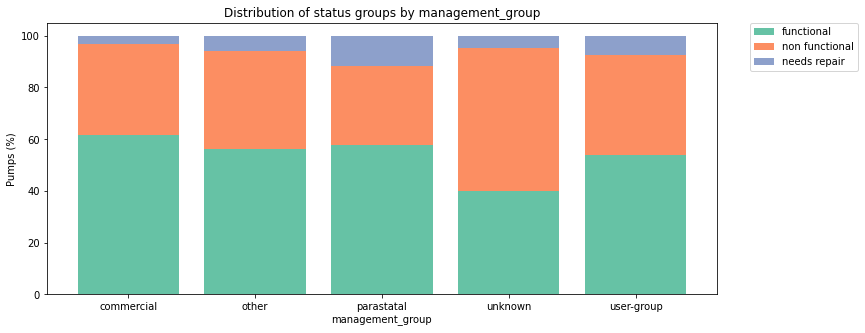

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = management_group_disb.index.values
ax.bar(labels, management_group_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, management_group_disb ['non_functional_pumps_%'], label = 'non functional', bottom = management_group_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, management_group_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = management_group_disb['functional_pumps_%'] + management_group_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by management_group', xlabel = 'management_group', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. management and management_group capture same information at diffrent granularity levels
2. management shows better distribution across class labels
3. Any one of them, preferably management could be used for model training

__(14) payment :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='payment']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
21,payment,object,59400,7,0,0.0,never pay,25348,42.67


In [ ]:
# Checking payment feature
payment_disb = check_distribution(train_df, 'payment')
payment_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
payment,,,,,
never pay,25348,42.7,44.9,47.6,7.5
other,1054,1.8,58.0,30.8,11.2
pay annually,3642,6.1,75.2,18.0,6.8
pay monthly,8300,14.0,66.0,22.8,11.2
pay per bucket,8985,15.1,67.8,27.7,4.6
pay when scheme fails,3914,6.6,62.1,30.9,7.1
unknown,8157,13.7,43.3,51.5,5.3


__(15) payment_type :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='payment_type']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
22,payment_type,object,59400,7,0,0.0,never pay,25348,42.67


In [ ]:
# Checking payment_type feature
payment_type_disb = check_distribution(train_df, 'payment_type')
payment_type_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
payment_type,,,,,
annually,3642,6.1,75.2,18.0,6.8
monthly,8300,14.0,66.0,22.8,11.2
never pay,25348,42.7,44.9,47.6,7.5
on failure,3914,6.6,62.1,30.9,7.1
other,1054,1.8,58.0,30.8,11.2
per bucket,8985,15.1,67.8,27.7,4.6
unknown,8157,13.7,43.3,51.5,5.3


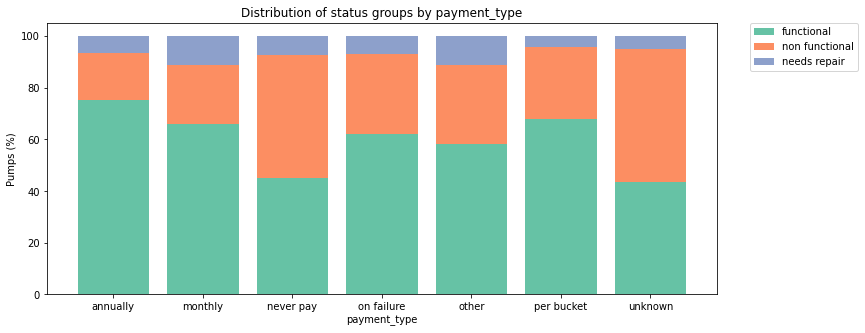

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = payment_type_disb.index.values
ax.bar(labels, payment_type_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, payment_type_disb ['non_functional_pumps_%'], label = 'non functional', bottom = payment_type_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, payment_type_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = payment_type_disb['functional_pumps_%'] + payment_type_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by payment_type', xlabel = 'payment_type', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. payment and payment_type capture same information with different names for categories
2. both show same distribution across class labels
3. Any one of them, could be used for model training

__(16) water_quality :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='water_quality']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
23,water_quality,object,59400,8,0,0.0,soft,50818,85.55


In [ ]:
# Checking water_quality feature
water_quality_disb = check_distribution(train_df, 'water_quality')
water_quality_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
water_quality,,,,,
coloured,490,0.8,50.2,38.8,11.0
fluoride,200,0.3,75.5,18.0,6.5
fluoride abandoned,17,0.0,35.3,64.7,0.0
milky,804,1.4,54.5,43.8,1.7
salty,4856,8.2,45.7,49.6,4.6
salty abandoned,339,0.6,51.3,27.4,21.2
soft,50818,85.6,56.6,35.7,7.7
unknown,1876,3.2,14.1,84.1,1.9


__(17) quality_group:__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='quality_group']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
24,quality_group,object,59400,6,0,0.0,good,50818,85.55


In [ ]:
# Checking quality_group feature
quality_group_disb = check_distribution(train_df, 'quality_group')
quality_group_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
quality_group,,,,,
colored,490,0.8,50.2,38.8,11.0
fluoride,217,0.4,72.4,21.7,6.0
good,50818,85.6,56.6,35.7,7.7
milky,804,1.4,54.5,43.8,1.7
salty,5195,8.7,46.1,48.2,5.7
unknown,1876,3.2,14.1,84.1,1.9


__Observation(s)__:

1. water_quality and quality_group capture same information at different granularity levels
2. water_quality shows better distribution across class labels
3. Any one of them, preferably water_quality could be used for model training

__(18) quantity :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='quantity']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
25,quantity,object,59400,5,0,0.0,enough,33186,55.87


In [ ]:
# Checking quantity feature
quantity_disb = check_distribution(train_df, 'quantity')
quantity_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
quantity,,,,,
dry,6246,10.5,2.5,96.9,0.6
enough,33186,55.9,65.2,27.5,7.2
insufficient,15129,25.5,52.3,38.1,9.6
seasonal,4050,6.8,57.4,32.3,10.3
unknown,789,1.3,27.0,71.2,1.8


__(19) quantity_group :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='quantity_group']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
26,quantity_group,object,59400,5,0,0.0,enough,33186,55.87


In [ ]:
# Checking quantity_group feature
quantity_group_disb = check_distribution(train_df, 'quantity_group')
quantity_group_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
quantity_group,,,,,
dry,6246,10.5,2.5,96.9,0.6
enough,33186,55.9,65.2,27.5,7.2
insufficient,15129,25.5,52.3,38.1,9.6
seasonal,4050,6.8,57.4,32.3,10.3
unknown,789,1.3,27.0,71.2,1.8


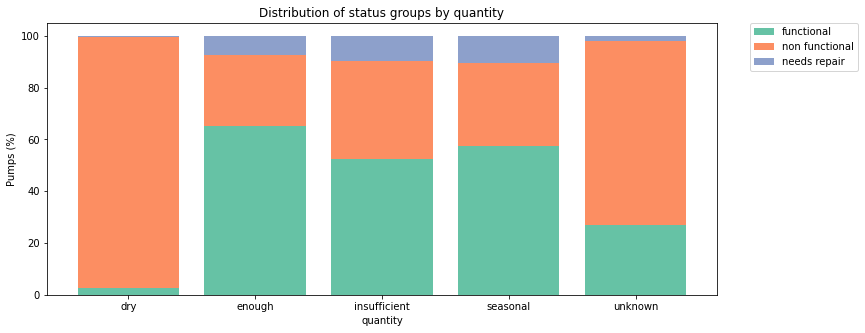

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = quantity_disb.index.values
ax.bar(labels, quantity_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, quantity_disb ['non_functional_pumps_%'], label = 'non functional', bottom = quantity_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, quantity_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = quantity_disb['functional_pumps_%'] + quantity_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by quantity', xlabel = 'quantity', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. quantity and quantity_group are same features with different names hence any one of them could be used for model training
2. it appears to be important feature for model training since pupms with less quantity tend to be more non functional or in need of repair


__(20) source :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='source']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
27,source,object,59400,10,0,0.0,spring,17021,28.65


In [ ]:
# Checking source feature
source_disb = check_distribution(train_df, 'source')
source_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
source,,,,,
dam,656,1.1,38.6,57.8,3.7
hand dtw,874,1.5,56.9,41.2,1.9
lake,765,1.3,21.2,77.3,1.6
machine dbh,11075,18.6,49.0,46.6,4.4
other,212,0.4,59.4,40.1,0.5
rainwater harvesting,2295,3.9,60.4,25.9,13.7
river,9612,16.2,56.9,30.4,12.7
shallow well,16824,28.3,49.5,44.8,5.7
spring,17021,28.7,62.2,30.3,7.5


__(21) source_type :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='source_type']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
28,source_type,object,59400,7,0,0.0,spring,17021,28.65


In [ ]:
# Checking source_type feature
source_type_disb = check_distribution(train_df, 'source_type')
source_type_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
source_type,,,,,
borehole,11949,20.1,49.5,46.2,4.3
dam,656,1.1,38.6,57.8,3.7
other,278,0.5,56.8,41.4,1.8
rainwater harvesting,2295,3.9,60.4,25.9,13.7
river/lake,10377,17.5,54.2,33.9,11.9
shallow well,16824,28.3,49.5,44.8,5.7
spring,17021,28.7,62.2,30.3,7.5


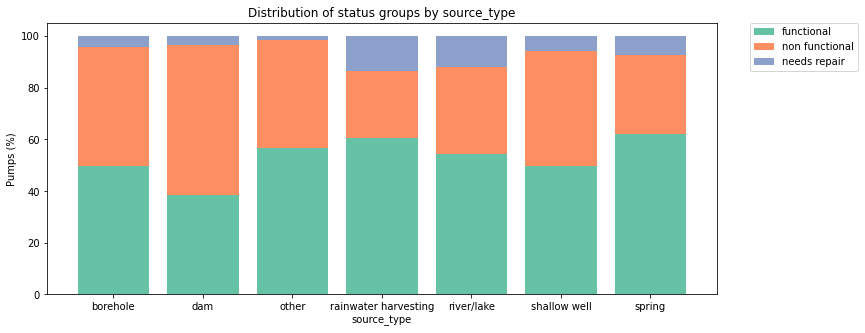

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = source_type_disb.index.values
ax.bar(labels, source_type_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, source_type_disb ['non_functional_pumps_%'], label = 'non functional', bottom = source_type_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, source_type_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = source_type_disb['functional_pumps_%'] + source_type_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by source_type', xlabel = 'source_type', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. source and source_type capture same information at different granularity levels
2. source_type shows better distribution across class labels
3. Any one of them, preferable source_type feature could be used for model training

__(22) source_class :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='source_class']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
29,source_class,object,59400,3,0,0.0,groundwater,45794,77.09


In [ ]:
# Checking source_class feature
source_class_disb = check_distribution(train_df, 'source_class')
source_class_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
source_class,,,,,
groundwater,45794,77.1,54.2,39.8,6.0
surface,13328,22.4,54.5,33.7,11.8
unknown,278,0.5,56.8,41.4,1.8


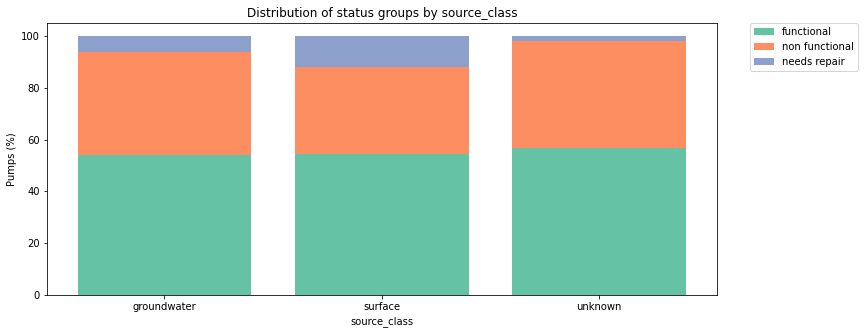

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = source_class_disb.index.values
ax.bar(labels, source_class_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, source_class_disb ['non_functional_pumps_%'], label = 'non functional', bottom = source_class_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, source_class_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = source_class_disb['functional_pumps_%'] + source_class_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by source_class', xlabel = 'source_class', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. source_class is more high level version of source_type
2. it shows almost similar distribution across all class labels but could be helpful in prediction if the pump is non funtional or needs repair

__(23) waterpoint_type :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='waterpoint_type']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
30,waterpoint_type,object,59400,7,0,0.0,communal standpipe,28522,48.02


In [ ]:
# Checking waterpoint_type feature
waterpoint_type_disb = check_distribution(train_df, 'waterpoint_type')
waterpoint_type_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
waterpoint_type,,,,,
cattle trough,116,0.2,72.4,25.9,1.7
communal standpipe,28522,48.0,62.1,29.9,7.9
communal standpipe multiple,6103,10.3,36.6,52.8,10.6
dam,7,0.0,85.7,14.3,0.0
hand pump,17488,29.4,61.8,32.3,5.9
improved spring,784,1.3,71.8,17.3,10.8
other,6380,10.7,13.2,82.2,4.6


__(24) waterpoint_type_group :__

In [ ]:
categorical_dqr.loc[categorical_dqr['Feature Name']=='waterpoint_type_group']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
31,waterpoint_type_group,object,59400,6,0,0.0,communal standpipe,34625,58.29


In [ ]:
# Checking waterpoint_type_group feature
waterpoint_type_group_disb = check_distribution(train_df, 'waterpoint_type_group')
waterpoint_type_group_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
waterpoint_type_group,,,,,
cattle trough,116,0.2,72.4,25.9,1.7
communal standpipe,34625,58.3,57.6,34.0,8.4
dam,7,0.0,85.7,14.3,0.0
hand pump,17488,29.4,61.8,32.3,5.9
improved spring,784,1.3,71.8,17.3,10.8
other,6380,10.7,13.2,82.2,4.6


__Observation(s)__ :

1. waterpoint_type and waterpoint_type_group capture same information at different granularity levels
2. waterpoint_type appears to show better distribution across class labels
3. Any one feature, preferably waterpoint_type could be used for model training

##<font color='brown'>3.6 Analyzing Date based features</font>

### 3.6.1 Get date based features

In [ ]:
# Converting date_recorded dtype to datetime format
train_df_date = train_df.copy()
train_df_date['date_recorded'] = pd.to_datetime(train_df['date_recorded'])

# Creating separate year and month columns
train_df_date['record_year'] = train_df_date['date_recorded'].dt.year
train_df_date['record_month'] = train_df_date['date_recorded'].dt.month

train_df_date.head(5)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,record_year,record_month
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7


### 3.6.2 Data Quality Report

In [ ]:
date_cols = ['record_year', 'record_month']
date_dqr = get_categorical_dqr(date_cols, train_df_date)
date_dqr

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
0,record_year,int64,59400,5,0,0.0,2011,28674,48.27
1,record_month,int64,59400,12,0,0.0,3,17936,30.20


In [ ]:
train_df_date.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,record_year,record_month
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7


### 3.6.3 Individual Feature wise EDA

__(1) record_year :__

In [ ]:
date_dqr.loc[date_dqr['Feature Name'] == 'record_year']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
0,record_year,int64,59400,5,0,0.0,2011,28674,48.27


In [ ]:
# Get record_year distribution
record_year_disb = check_distribution(train_df_date, 'record_year')
record_year_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
record_year,,,,,
2002,1,0.0,100.0,0.0,0.0
2004,30,0.1,33.3,63.3,3.3
2011,28674,48.3,56.6,37.1,6.3
2012,6424,10.8,48.7,45.7,5.6
2013,24271,40.9,53.2,38.0,8.8


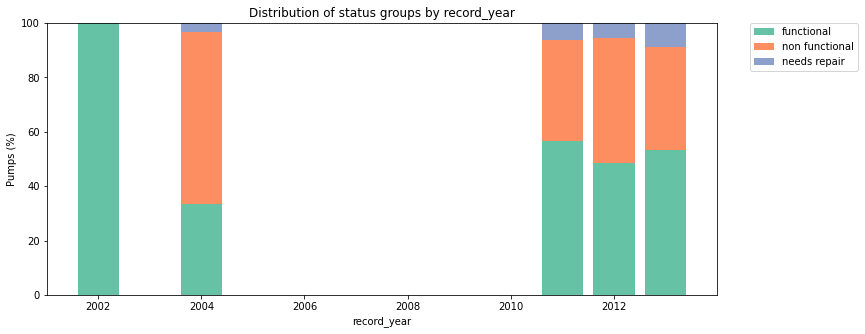

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = record_year_disb.index.values
ax.bar(labels, record_year_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, record_year_disb ['non_functional_pumps_%'], label = 'non functional', bottom = record_year_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, record_year_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = record_year_disb['functional_pumps_%'] + record_year_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by record_year', xlabel = 'record_year', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:

1. year 2002 has only 1 record
2. year 2011, 2012, 2013 have around 99% records
3. record_year shows almost same ditribution across all class labels
4. record_year and construction_year features could be used to create new feature related to waterpoint age, which could be a useful feature

__(2) record_month :__

In [ ]:
date_dqr.loc[date_dqr['Feature Name'] == 'record_month']

,Feature Name,Data Type,Records,Unique Values,Missing Values,Missing Percentage,Mode Value,Mode Frequency,Mode Percent
1,record_month,int64,59400,12,0,0.0,3,17936,30.2


In [ ]:
# Get record_month distribution
record_month_disb = check_distribution(train_df_date, 'record_month')
record_month_disb

,total_pumps,total_pumps_%,functional_pumps_%,non_functional_pumps_%,functional_needs_repair_pumps_%
record_month,,,,,
1,6354,10.7,41.1,46.2,12.7
2,12402,20.9,55.2,37.3,7.5
3,17936,30.2,61.7,33.3,5.0
4,3970,6.7,51.6,37.3,11.0
5,336,0.6,60.1,36.9,3.0
6,346,0.6,78.0,19.4,2.6
7,6928,11.7,50.2,41.9,7.9
8,3364,5.7,51.1,41.4,7.5
9,328,0.6,65.2,31.7,3.0


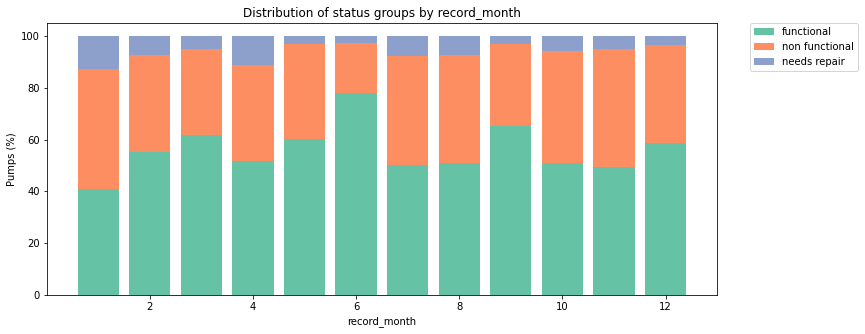

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
labels = record_month_disb.index.values
ax.bar(labels, record_month_disb['functional_pumps_%'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, record_month_disb ['non_functional_pumps_%'], label = 'non functional', bottom = record_month_disb['functional_pumps_%'] , color = '#fc8e62')
ax.bar(labels, record_month_disb ['functional_needs_repair_pumps_%'], label = 'needs repair', bottom = record_month_disb['functional_pumps_%'] + record_month_disb['non_functional_pumps_%'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by record_month', xlabel = 'record_month', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

__Observation(s)__:


1. Tanzania Rains:

        heaviest rains (called masika) -> mid-March to May
        shorter period of rain -> November to mid-January

2. Tanzania Seasons:

        dry season -> May to October
        summer -> November to March

3. It can be observed that pumps recorded during heavy rains tend to be more functional compared to pumps recorded during dry season.
4. Also record_month shows good_distribution across class labels hence could be used for model training. Else, a new feature indicating season can be derived which could also be helpful for prediction task.



Reference: https://www.nathab.com/know-before-you-go/african-safaris/east-africa/weather-climate/tanzania/


##<font color='brown'>3.7 Multivariate Analysis and Data Visualisation</font>

### 3.7.1 Correlation between Numerical Features

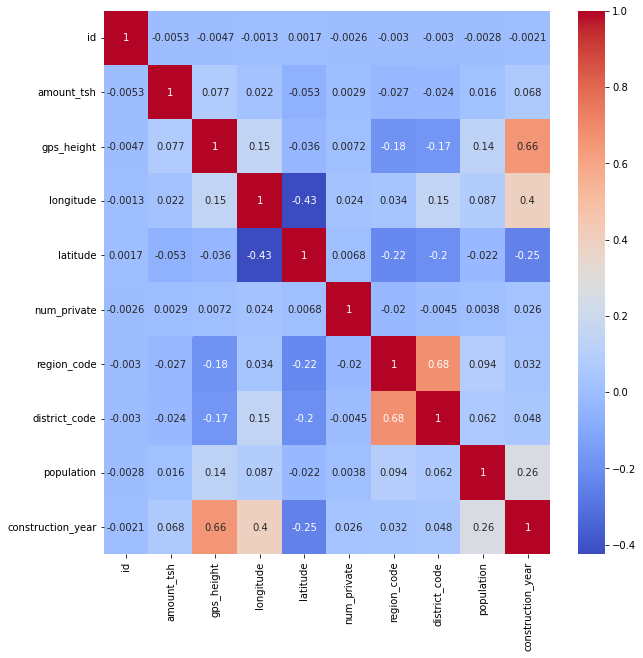

In [ ]:
# Get correlation matrix
temp = train_df[numerical_cols]
corr_mat = temp.corr()

# Plot correlation matrix heatmap
plt.figure(figsize=(10,10))
sns.heatmap(corr_mat, cmap='coolwarm', annot=True)
plt.show()

__Observation(s)__: 

1. There are no very highly correlated features.
2. district_code and region_code appear to be positively correlated since they are similar, treating them as categorical will be more ideal.
3. latitude and longitude are negatively correlatedand both of them are important since they give waterpoint location together

###3.7.2 Pair Plots for Numerical Features

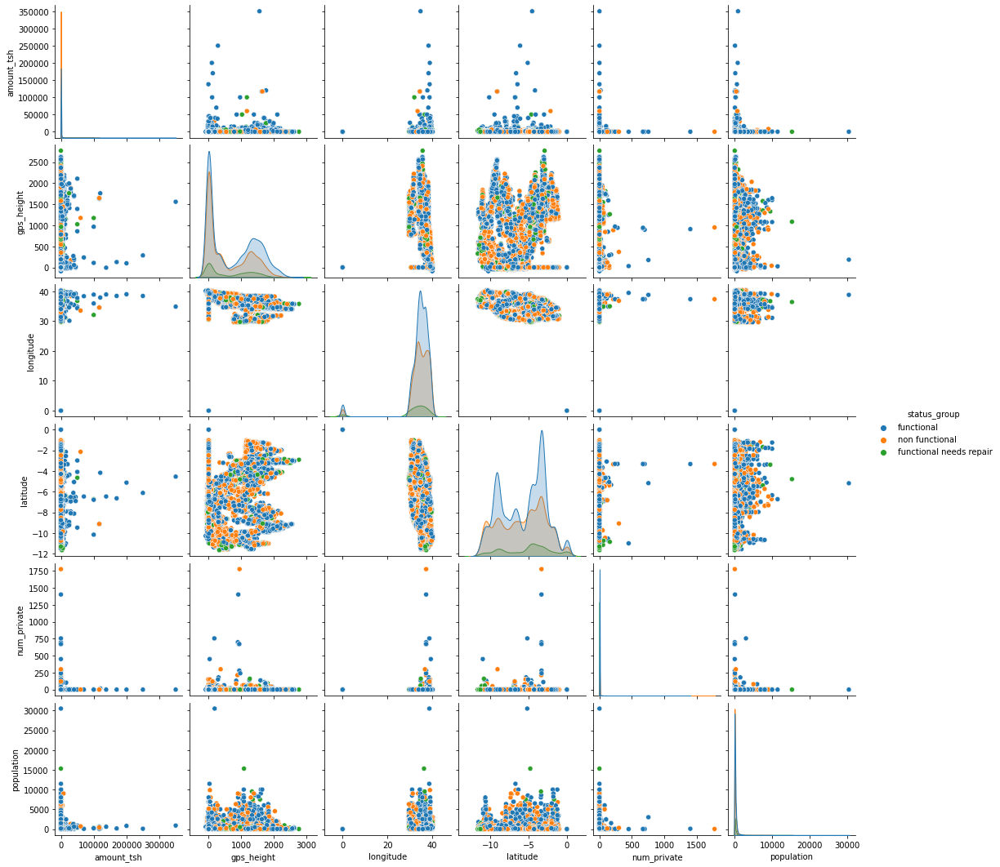

In [6]:
temp = train_df[["amount_tsh", "gps_height", "longitude", "latitude", "num_private",
                 "population", "status_group"]]
sns.pairplot(temp, hue="status_group")
plt.savefig('pairplots.png')
plt.show()

__Observation(s)__:

For various combinations of numerical features

1. Points of all class labels show high amount of overlapping
2. PDFs of all variables are also highly overlapped
3. Latitide and longitude pair plot show very closely packed scatter map
4. Points are are not easily separable

###3.7.3 Parallel Coordinate Plots for amount_tsh, gps_height, longitude, latitude, num_private, population

Text(0.5, 1.0, 'Parallel Co-ordinates Plot')

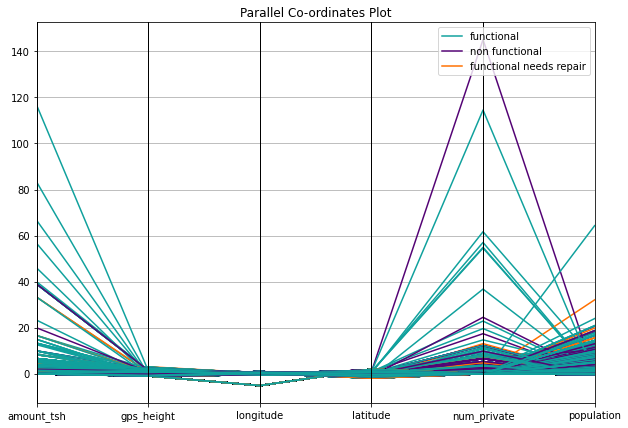

In [ ]:
num_cols = ["amount_tsh", "gps_height", "longitude", "latitude", "num_private",
            "population"]
temp = train_df[num_cols]
#Scaling data
scaler = StandardScaler()
temp_scaled = scaler.fit_transform(temp)
temp_scaled_df = pd.DataFrame(temp_scaled, columns=num_cols)
temp_df = pd.concat([temp_scaled_df, train_df["status_group"]], axis=1)

# Plot
plt.figure(figsize=(10,7))
pc = parallel_coordinates(temp_df, "status_group", color=('#10A19D', '#540375', '#FF7000'))
plt.title("Parallel Co-ordinates Plot")

__Observation(s)__:

1. Lines indication functional status are dense since it is most occuring class label
2. There is alot of overlap between lines of all class labels

###3.7.4 Joint Plots

__Latitude and Longitude__

<Figure size 576x576 with 0 Axes>

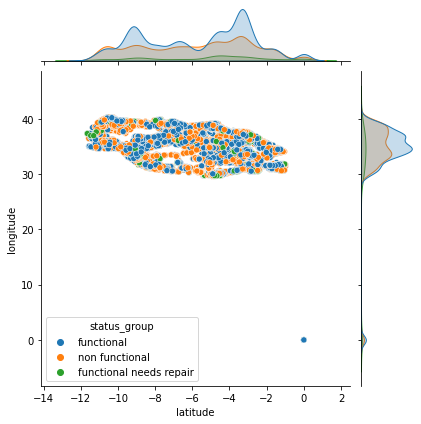

In [ ]:
plt.figure(figsize=(8,8))
jp = sns.jointplot(x='latitude', y='longitude', data=train_df,
              hue='status_group', kind='scatter')

__Observation(s)__:

1. Some records have outlying longitude and latitude values
2. Pdfs of latitude and longitude show overlap since waterpoints with all 3 class labels are present at locations across Tanzania.

__gps_height and population__

<Figure size 576x576 with 0 Axes>

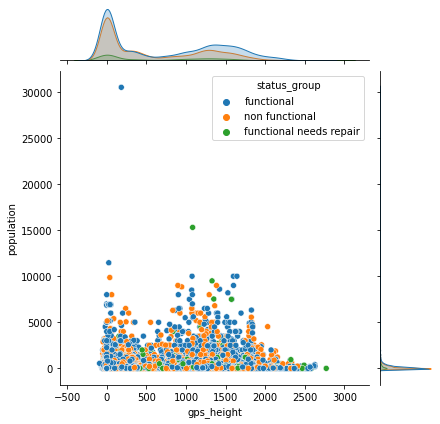

In [ ]:
plt.figure(figsize=(8,8))
jp = sns.jointplot(x='gps_height', y='population', data=train_df,
              hue='status_group', kind='scatter')

__Observation(s)__:

1. Most points are having values close to zero.
2. points show overlap hence not easily separable

###3.7.5 gps_height and quantity relation

Text(1.0, 1.0, 'Status group = Functional Needs Repair')

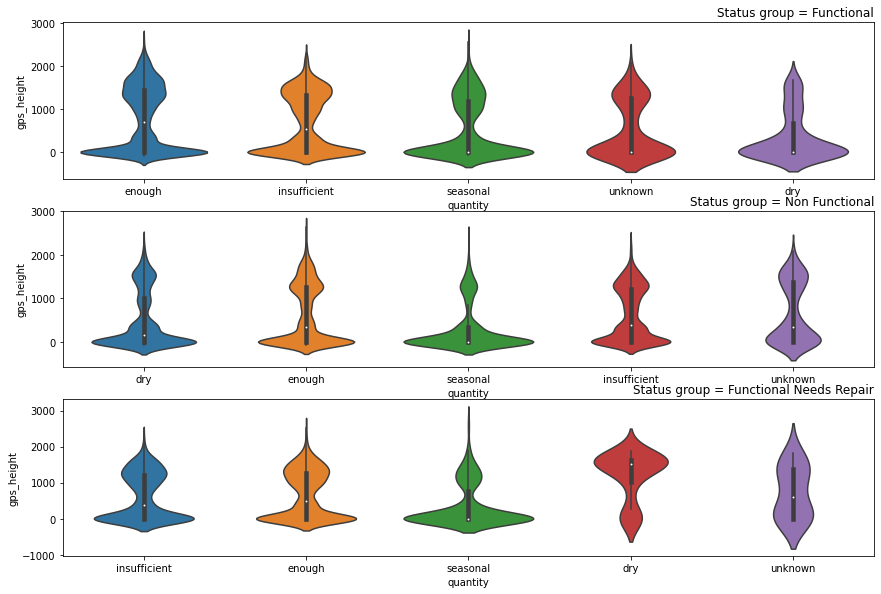

In [ ]:
temp_f = train_df[train_df["status_group"]=="functional"]
temp_n = train_df[train_df["status_group"]=="non functional"]
temp_r = train_df[train_df["status_group"]=="functional needs repair"]

fig, ax = plt.subplots(3, 1, figsize=(12, 8))
plt.tight_layout()
plt.subplot(3,1,1)
sns.violinplot("quantity", "gps_height", data=temp_f)
plt.title("Status group = Functional", loc="right")

plt.subplot(3,1,2)
sns.violinplot("quantity", "gps_height", data=temp_n)
plt.title("Status group = Non Functional", loc="right")

plt.subplot(3,1,3)
sns.violinplot("quantity", "gps_height", data=temp_r)
plt.title("Status group = Functional Needs Repair", loc="right")

__observation(s)__:

1. Across all 3 class labels, many points have gps_height close to 0
2. Dry and unknown water quantity points showed different distribution of gps_height across class labels. Other categories showed almost similar distributions across all 3 class labels.

###3.7.6 longitude, latitude, water_quality, status_group relation

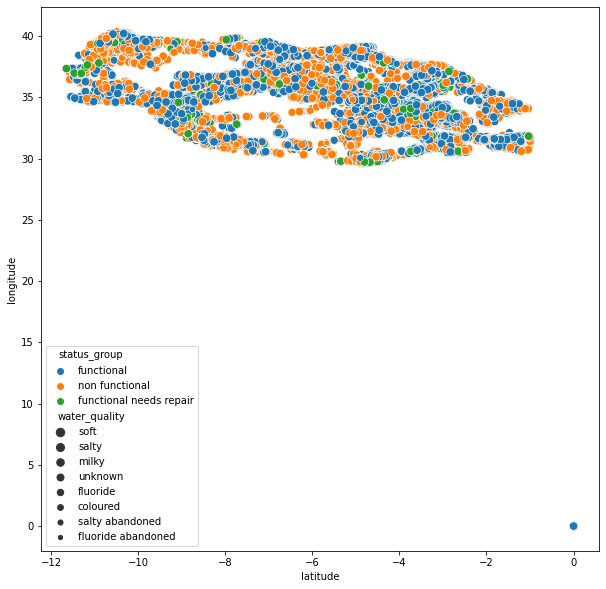

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot('latitude', 'longitude', hue="status_group", size="water_quality",
                data=train_df)

### 3.7.7 qunatity, source_class, status_group Relation

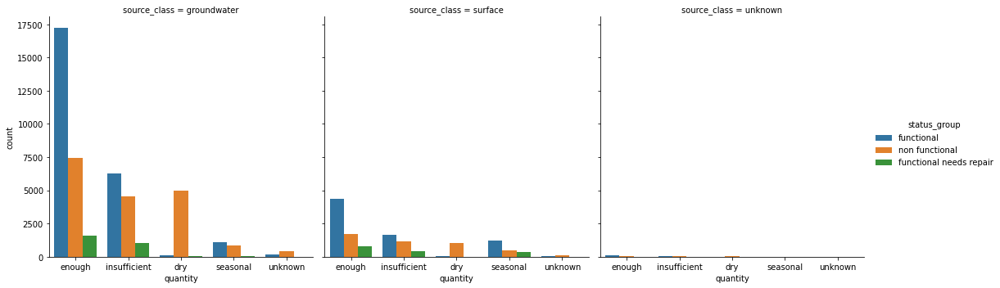

In [ ]:
sns.catplot("quantity", hue="status_group", col="source_class", data=train_df,
            kind='count')

__Observation(s)__:
1. Be it any source, dry waterpoints tend to be non functional
2. There are more water points with groundwater as source than surface as source
3. Waterpoints with seasonal water quantity are more functional for groundwater source than for surface water source.

###3.7.8 TSNE Visualisation

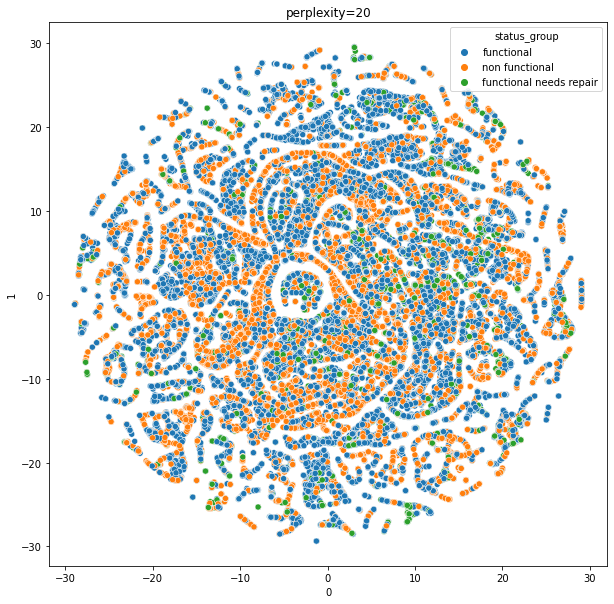

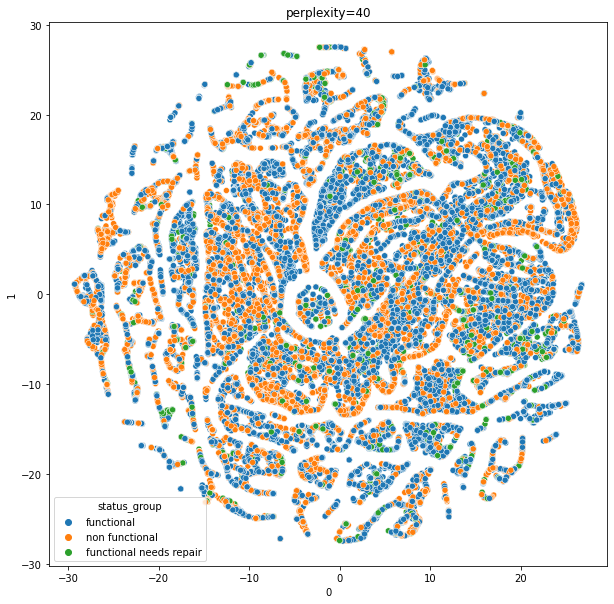

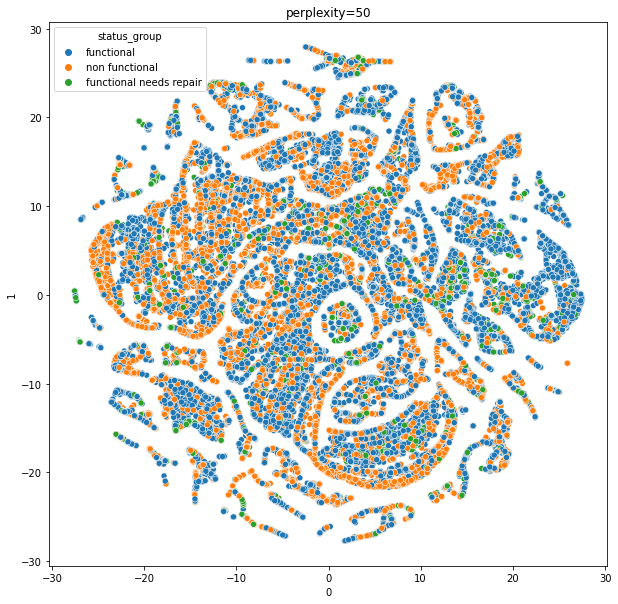

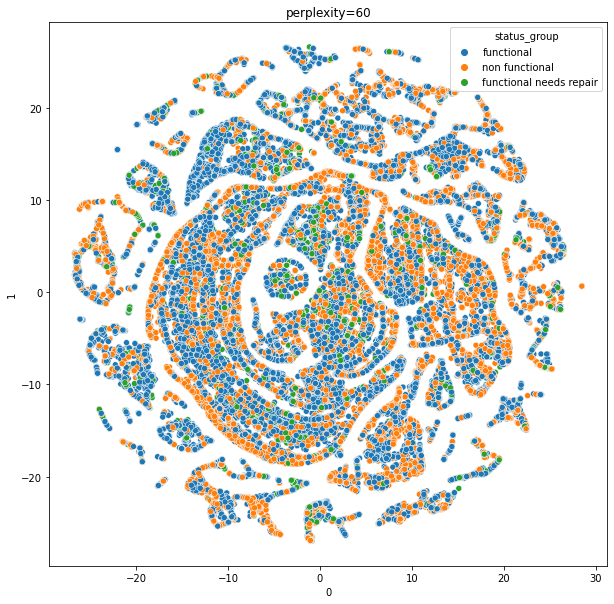

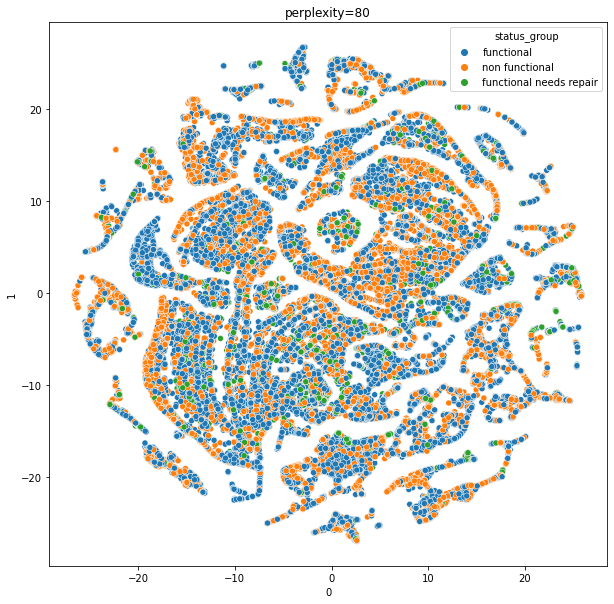

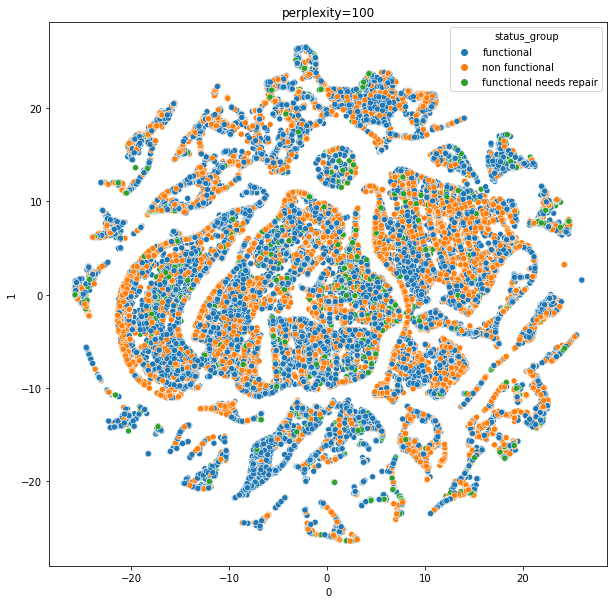

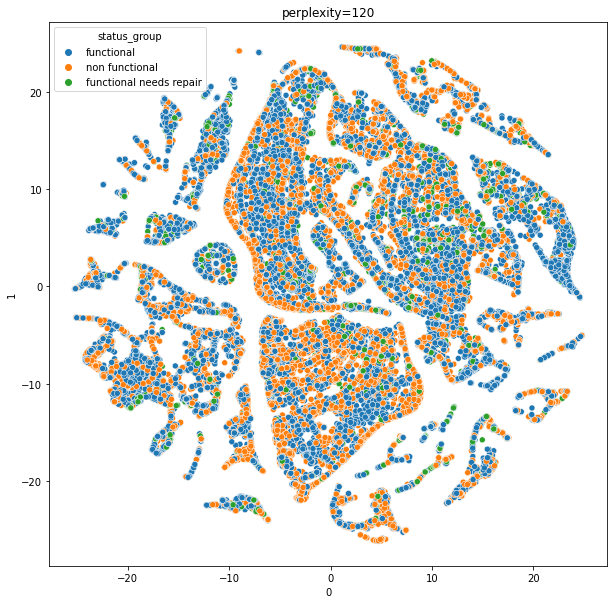

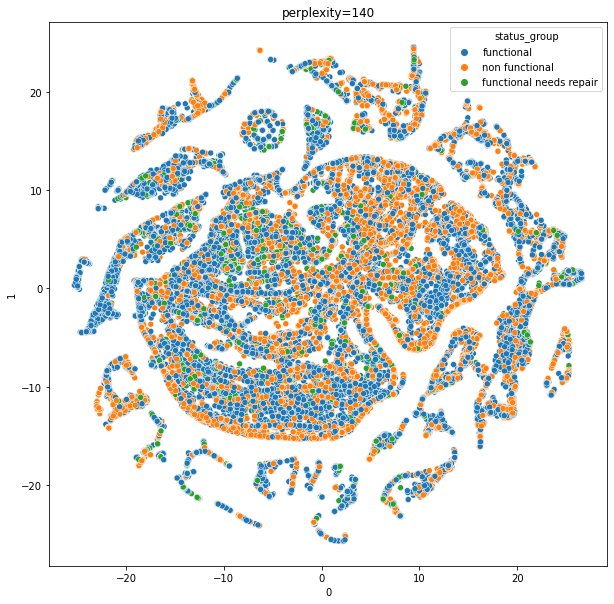

In [ ]:
#Tsne
p_list = [20, 40, 50, 60, 80, 100, 120, 140]

temp = train_df[['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'population',
                 'construction_year']]

for p in p_list:
    tsne = TSNE(perplexity=p, n_iter=500).fit_transform(temp)

    #plot 2d tsne embedding
    temp_dict = {'0': tsne[:, 0], '1': tsne[:, 1], "status_group":train_df["status_group"].values}
    temp_df = pd.DataFrame(temp_dict)
    plt.figure(figsize=(10,10))
    sns.scatterplot(x="0", y="1", hue="status_group", data=temp_df)
    plt.title(f"perplexity={p}")

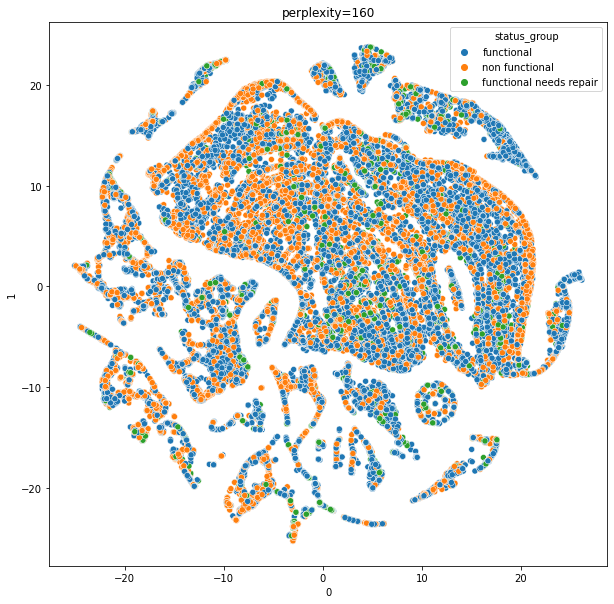

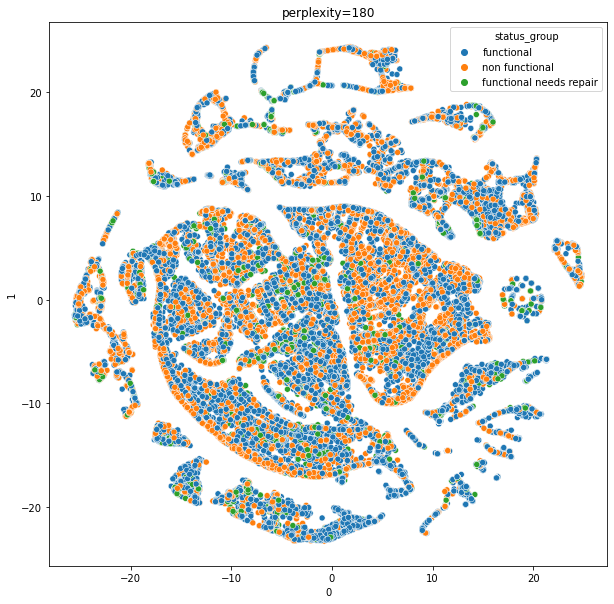

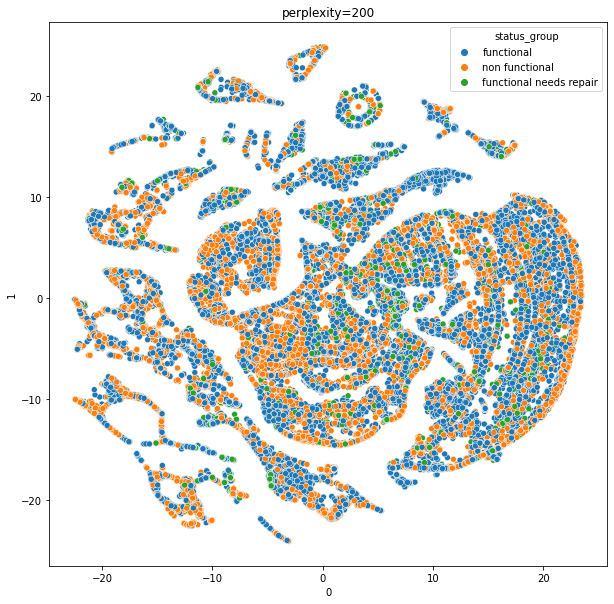

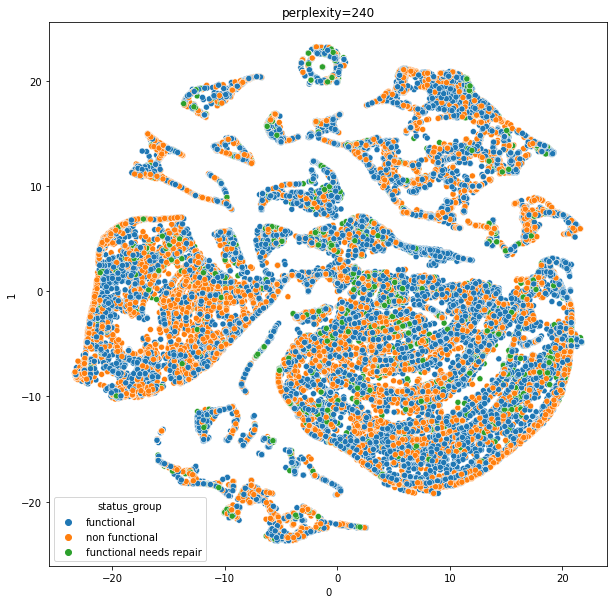

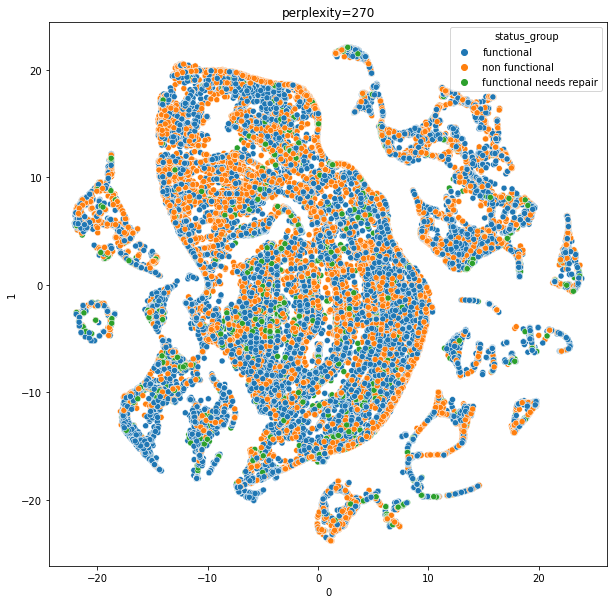

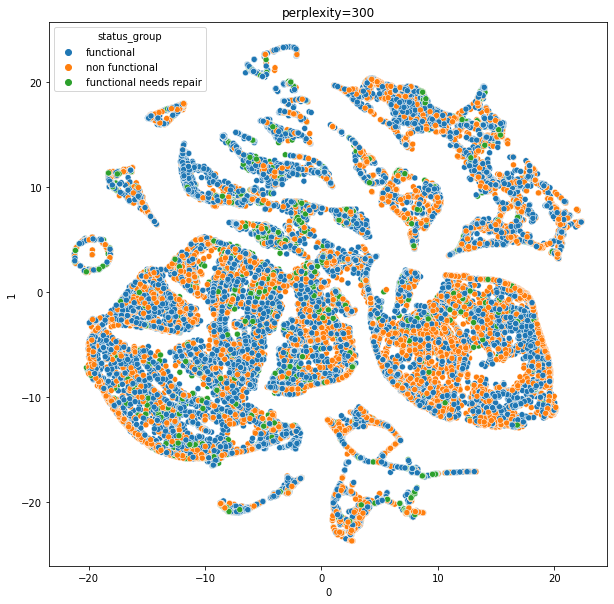

In [ ]:
p_list = [160, 180, 200, 240, 270, 300]

temp = train_df[['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'population',
                 'construction_year']]

for p in p_list:
    tsne = TSNE(perplexity=p, n_iter=500).fit_transform(temp)

    #plot 2d tsne embedding
    temp_dict = {'0': tsne[:, 0], '1': tsne[:, 1], "status_group":train_df["status_group"].values}
    temp_df = pd.DataFrame(temp_dict)
    plt.figure(figsize=(10,10))
    sns.scatterplot(x="0", y="1", hue="status_group", data=temp_df)
    plt.title(f"perplexity={p}")

__Observation(s)__:

1. With higher perplexity, there are some cluster formations.
2. Clusters do not repersent any one particular class label, there is huge overlap of class labels in clusters.

### 3.7.9 Multivariate Analysis of Categorical Variables using Logistic Regression

We will encode above analyzed categorical variables and train a Logistic Regerssion model on this data and will check this model's feature importance to get an idea about categorical variables dependency on class labels.

                         precision    recall  f1-score   support

             functional       0.74      0.89      0.81      6452
functional needs repair       0.58      0.10      0.17       863
         non functional       0.78      0.68      0.73      4565

               accuracy                           0.75     11880
              macro avg       0.70      0.55      0.57     11880
           weighted avg       0.74      0.75      0.73     11880



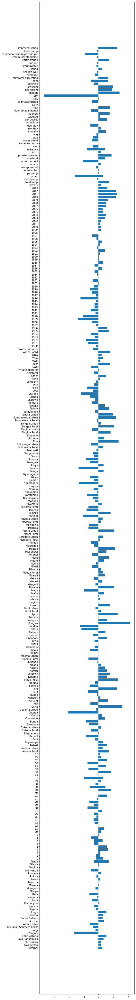

In [ ]:
# Encoding categorical variables
basin = pd.get_dummies(train_df["basin"])
region = pd.get_dummies(train_df["region"])
region_code = pd.get_dummies(train_df["region_code"])
district_code = pd.get_dummies(train_df["district_code"])
lga = pd.get_dummies(train_df["lga"])
public_meeting = pd.get_dummies(train_df["public_meeting"])
scheme_management = pd.get_dummies(train_df["scheme_management"])
permit = pd.get_dummies(train_df["permit"])
construction_year = pd.get_dummies(train_df["construction_year"])
extraction_type_class = pd.get_dummies(train_df["extraction_type_class"])
management = pd.get_dummies(train_df["management"])
payment_type = pd.get_dummies(train_df["payment_type"])
water_quality = pd.get_dummies(train_df["water_quality"])
quantity = pd.get_dummies(train_df["quantity"])
source_type = pd.get_dummies(train_df["source_type"])
source_class = pd.get_dummies(train_df["source_class"])
waterpoint_type = pd.get_dummies(train_df["waterpoint_type"])

# concat encoded data
y = train_df[["status_group"]]
x = pd.concat([basin, region, region_code, district_code,
                lga, public_meeting, scheme_management, permit,
                construction_year, extraction_type_class, management,
                payment_type, water_quality, quantity, source_type,
                source_class, waterpoint_type], axis=1)

# spliting data
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, stratify=y,
                                                random_state=42)

# train logistic regression
lr = LogisticRegression(multi_class='ovr')
lr.fit(xtrain, ytrain)

# classification report
pred = lr.predict(xtest) 
print(classification_report(ytest,pred))

# feature importances
plt.figure(figsize=(7,75))
importance = lr.coef_
columns = [str(i) for i in x.columns]
plt.barh(columns, importance[0])
plt.show()

From above bar chart it is clear that some values for all the features are having high feature importance,  it means that all these features are important for predicting class label.

##<font color='brown'>3.8 EDA Summary</font>

1. amount_tsh and num_private have values as 0 for most of the records
2. some  features like funder, installer, wpt_name, subvillage, ward, scheme_name have very high cardinality
3. Some pairs of features e.g payment, payent_type etc. capture same information at different granularity levels.
4. Some new features could be engineered using date based features
5. Some features eg. gps_height and longitude have invalid values which can be imputed or dropped.
6. Some features have missing values which could be imputed.
7. Some features show good distribution across class labels which could be really helpful in prediction task.

# <font color='orange'>4. Data Imputation 

##<font color='brown'>4.1 Imputing Missing Values in the Data </font>

Some features have certain amount of missing values in the dataset. We have only 59400 records in the data, removing records with missiing values will further reduce the dataset size and it will affect model training. Hence we should impute missing values using smart techniques.

In [ ]:
# Initializing imputed datset
imputed_df = train_df.copy()

###4.1.1 gps_height

In [ ]:
# Strategy -> median value imputation
GPS_HEIGHT_MEDIAN = train_df['gps_height'].median()
imputed_df['gps_height'] = np.where(imputed_df['gps_height'] <= 0, GPS_HEIGHT_MEDIAN, imputed_df['gps_height'])

###4.1.2 latitude

Tanzania latitude range: -11.8 to -1

Reference: https://www.latlong.net/

In [ ]:
# Strategy -> median value imputation
LATITUDE_MEDIAN = train_df['latitude'].median()
imputed_df['latitude'] = np.where(imputed_df['latitude'] < -11.8, LATITUDE_MEDIAN, imputed_df['latitude'])
imputed_df['latitude'] = np.where(imputed_df['latitude'] > -1, LATITUDE_MEDIAN, imputed_df['latitude'])

###4.1.3 longitude

Tanzania longitude range: 29 to 40.8

Reference: https://www.latlong.net/

In [ ]:
# Strategy -> median value imputation
LONGITUDE_MEDIAN = train_df['longitude'].median()
imputed_df['longitude'] = np.where(imputed_df['longitude'] < 29, LONGITUDE_MEDIAN, imputed_df['longitude'])
imputed_df['longitude'] = np.where(imputed_df['longitude'] > 40.8, LONGITUDE_MEDIAN, imputed_df['longitude'])

### 4.1.4 public_meeting

In [ ]:
# Strategy -> mode value imputation
PUBLIC_MEETING_MODE = True
imputed_df['public_meeting'] = imputed_df['public_meeting'].fillna(PUBLIC_MEETING_MODE)

### 4.1.5 scheme_management

In [ ]:
# Strategy -> mode value imputation
SCHEME_MANAGEMENT_MODE = str(train_df['scheme_management'].mode())
imputed_df['scheme_management'] = imputed_df['scheme_management'].fillna(SCHEME_MANAGEMENT_MODE)

### 4.1.6 permit

In [ ]:
# Strategy -> mode value imputation
PERMIT_MODE = True
imputed_df['permit'] = imputed_df['permit'].fillna(PERMIT_MODE)

### 4.1.7 construction_year

In [ ]:
# Strategy -> 27% waterpoints were constructed between 2000 to 2012, we can
#             randomly impute values between 2000 to 2012

def year_imputer(x):
    """
    Function to impute construction_year in data
    """
    if x == 0:
        year_range = list(range(2000, 2013))
        impute_year = random.choice(year_range)
        return impute_year

imputed_df['construction_year'] = np.where(imputed_df['construction_year'] == 0,
                                           imputed_df['construction_year'].apply(year_imputer),
                                           imputed_df['construction_year'])

# <font color='orange'>5. Feature Engineering and Feature Selection 



##<font color='brown'>5.1 Feature Engineering </font>

1. A new feature named 'record_month' can be derived from feature date_recorded 
2. A new feature named 'waterpoint_age' can be engineered using features construction_year and date_recorded

In [ ]:
# Creating separate year and month columns
imputed_df['date_recorded'] = pd.to_datetime(imputed_df['date_recorded'])
imputed_df['record_year'] = imputed_df['date_recorded'].dt.year
imputed_df['record_month'] = imputed_df['date_recorded'].dt.month
imputed_df['waterpoint_age'] = imputed_df['record_year'] - imputed_df['construction_year']

In [ ]:
imputed_df.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting               0
recorded_by                  0
scheme_management            0
scheme_name              28166
permit                       0
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

##<font color='brown'>5.2 Feature Selection </font>

1. 'id' - Dropped since it is just row id 
2. 'amount_tsh' - Dropped since most of records have 0 value 
3. 'funder' - Dropped due to high cardinality
4. 'installer' - Dropped due to high cardinality
5. 'wpt_name' - Dropped due to high cardinality
6. 'num_private' - Dropped since most of records have 0 value 
7. 'subvillage' -  Dropped due to high cardinality
8. 'region_code' - Dropped since it is similar to region 
9. 'district_code' - Dropped since it is similar to region 
10. 'ward'- Dropped due to high cardinality
11. 'recorded_by' - Dropped since all the records have same value
12. 'scheme_name' - Dropped due to high cardinality
13. 'construction_year' - Dropped since new waterpoint_age feature is engineered from it
14. 'extraction_type' - Dropped since it is similar to extraction_type_class 
15. 'extraction_type_group' - Dropped since it is similar to extraction_type_class,
16. 'management_group'- Dropped since it is similar to management
17. 'payment' - Dropped since it is similar to payment_type
18. 'quality_group' - Dropped since it is similar to water_quality
19. 'quantity_group' Dropped since it is similar to quantity
20. 'source' - Dropped since it is simlar to source_type
21. 'waterpoint_type_group'- Dropped since it is similar to waterpoint_type 
22. 'date_recorded' - Dropped since a new feature 'record_month' and 'waterpoint_age' are derived from it

In [ ]:
dropped_features = ['id', 'amount_tsh', 'funder', 'installer', 'wpt_name',
                    'num_private', 'subvillage', 'region_code', 'district_code',
                    'ward', 'recorded_by', 'scheme_name', 'construction_year', 
                    'extraction_type', 'extraction_type_group', 'management_group', 
                    'payment', 'quality_group', 'quantity_group', 'source', 
                    'waterpoint_type_group', 'date_recorded']
imputed_dropped_df = imputed_df.drop(dropped_features, axis=1)
imputed_dropped_df.columns

Index(['gps_height', 'longitude', 'latitude', 'basin', 'region', 'lga',
       'population', 'public_meeting', 'scheme_management', 'permit',
       'extraction_type_class', 'management', 'payment_type', 'water_quality',
       'quantity', 'source_type', 'source_class', 'waterpoint_type',
       'status_group', 'record_year', 'record_month', 'waterpoint_age'],
      dtype='object')

In [ ]:
# treating record_year and record_month as categorical features
imputed_dropped_df[['record_year', 'record_month']] = imputed_dropped_df[['record_year', 'record_month']].astype('object')

In [ ]:
imputed_dropped_df.dtypes

gps_height               float64
longitude                float64
latitude                 float64
basin                     object
region                    object
lga                       object
population                 int64
public_meeting              bool
scheme_management         object
permit                      bool
extraction_type_class     object
management                object
payment_type              object
water_quality             object
quantity                  object
source_type               object
source_class              object
waterpoint_type           object
status_group              object
record_year               object
record_month              object
waterpoint_age           float64
dtype: object

In [ ]:
# Saving final dataframe
imputed_dropped_df.to_csv("final_df.csv")

# <font color='orange'>6. Preparing Data for Model Training

Data has Numerical and Categorical features. Numerical features need to be normalized and categorical features need to be encoded properly before model training.

##<font color='brown'>6.1 Train Test Split </font>

In [ ]:
# Separate features and label
y = imputed_dropped_df['status_group']
X = imputed_dropped_df.drop(['status_group'], axis=1)

In [ ]:
# Make train test split
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42, stratify=y)
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (47520, 21)
X_test shape: (11880, 21)
y_train shape: (47520,)
y_test shape: (11880,)


##<font color='brown'>6.2 Preparing Numerical Features </font>

###6.2.1 Normalize gps_height 

In [ ]:
gps_height_normalizer = MinMaxScaler()
gps_height_normalizer.fit(X_train['gps_height'].values.reshape(-1, 1))
train_gps_height_normalized = gps_height_normalizer.transform(X_train['gps_height'].values.reshape(-1, 1))
test_gps_height_normalized = gps_height_normalizer.transform(X_test['gps_height'].values.reshape(-1, 1))
joblib.dump(gps_height_normalizer, "gps_height_normalizer")

['gps_height_normalizer']

### 6.2.2 Normalize longitude

In [ ]:
longitude_normalizer = MinMaxScaler()
longitude_normalizer.fit(X_train['longitude'].values.reshape(-1, 1))
train_longitude_normalized = longitude_normalizer.transform(X_train['longitude'].values.reshape(-1, 1))
test_longitude_normalized = longitude_normalizer.transform(X_test['longitude'].values.reshape(-1, 1))
joblib.dump(longitude_normalizer, "longitude_normalizer")

['longitude_normalizer']

### 6.2.3 Normalize latitude

In [ ]:
latitude_normalizer = MinMaxScaler()
latitude_normalizer.fit(X_train['latitude'].values.reshape(-1, 1))
train_latitude_normalized = latitude_normalizer.transform(X_train['latitude'].values.reshape(-1, 1))
test_latitude_normalized = latitude_normalizer.transform(X_test['latitude'].values.reshape(-1, 1))
joblib.dump(latitude_normalizer, "latitude_normalizer")

['latitude_normalizer']

### 6.2.4 Normalize population

In [ ]:
population_normalizer = MinMaxScaler()
population_normalizer.fit(X_train['population'].values.reshape(-1, 1))
train_population_normalized = population_normalizer.transform(X_train['population'].values.reshape(-1, 1))
test_population_normalized = population_normalizer.transform(X_test['population'].values.reshape(-1, 1))
joblib.dump(population_normalizer, "population_normalizer")

['population_normalizer']

### 6.2.5 Normalize waterpoint_age

In [ ]:
waterpoint_age_normalizer = MinMaxScaler()
waterpoint_age_normalizer.fit(X_train['waterpoint_age'].values.reshape(-1, 1))
train_waterpoint_age_normalized = waterpoint_age_normalizer.transform(X_train['waterpoint_age'].values.reshape(-1, 1))
test_waterpoint_age_normalized = waterpoint_age_normalizer.transform(X_test['waterpoint_age'].values.reshape(-1, 1))
joblib.dump(waterpoint_age_normalizer, "waterpoint_age_normalizer")

['waterpoint_age_normalizer']

##<font color='brown'>6.3 Preparing Categorical Features </font>

###6.3.1 Encoding basin

In [ ]:
basin_encoder = OneHotEncoder(handle_unknown = 'ignore')
basin_encoder.fit(X_train['basin'].values.reshape(-1, 1))
train_basin_encoded = basin_encoder.transform(X_train['basin'].values.reshape(-1, 1))
test_basin_encoded = basin_encoder.transform(X_test['basin'].values.reshape(-1, 1))
joblib.dump(basin_encoder, "basin_encoder")

['basin_encoder']

###6.3.2 Encoding region

In [ ]:
region_encoder = OneHotEncoder(handle_unknown = 'ignore')
region_encoder.fit(X_train['region'].values.reshape(-1, 1))
train_region_encoded = region_encoder.transform(X_train['region'].values.reshape(-1, 1))
test_region_encoded = region_encoder.transform(X_test['region'].values.reshape(-1, 1))
joblib.dump(region_encoder, "region_encoder")

['region_encoder']

### 6.3.3 Encoding lga

In [ ]:
lga_encoder = OneHotEncoder(handle_unknown = 'ignore')
lga_encoder.fit(X_train['lga'].values.reshape(-1, 1))
train_lga_encoded = lga_encoder.transform(X_train['lga'].values.reshape(-1, 1))
test_lga_encoded = lga_encoder.transform(X_test['lga'].values.reshape(-1, 1))
joblib.dump(lga_encoder, "lga_encoder")

['lga_encoder']

###6.3.4 Encoding public_meeting

In [ ]:
public_meeting_encoder = OneHotEncoder(handle_unknown = 'ignore')
public_meeting_encoder.fit(X_train['public_meeting'].values.reshape(-1, 1))
train_public_meeting_encoded = public_meeting_encoder.transform(X_train['public_meeting'].values.reshape(-1, 1))
test_public_meeting_encoded = public_meeting_encoder.transform(X_test['public_meeting'].values.reshape(-1, 1))
joblib.dump(public_meeting_encoder, "public_meeting_encoder")

['public_meeting_encoder']

###6.3.5 Encoding scheme_management

In [ ]:
scheme_management_encoder = OneHotEncoder(handle_unknown = 'ignore')
scheme_management_encoder.fit(X_train['scheme_management'].values.reshape(-1, 1))
train_scheme_management_encoded = scheme_management_encoder.transform(X_train['scheme_management'].values.reshape(-1, 1))
test_scheme_management_encoded = scheme_management_encoder.transform(X_test['scheme_management'].values.reshape(-1, 1))
joblib.dump(scheme_management_encoder, "scheme_management_encoder")

['scheme_management_encoder']

### 6.3.6 Encoding permit

In [ ]:
permit_encoder = OneHotEncoder(handle_unknown = 'ignore')
permit_encoder.fit(X_train['permit'].values.reshape(-1, 1))
train_permit_encoded = permit_encoder.transform(X_train['permit'].values.reshape(-1, 1))
test_permit_encoded = permit_encoder.transform(X_test['permit'].values.reshape(-1, 1))
joblib.dump(permit_encoder, "permit_encoder")

['permit_encoder']

###6.3.7 Encoding extraction_type_class

In [ ]:
extraction_type_class_encoder = OneHotEncoder(handle_unknown = 'ignore')
extraction_type_class_encoder.fit(X_train['extraction_type_class'].values.reshape(-1, 1))
train_extraction_type_class_encoded = extraction_type_class_encoder.transform(X_train['extraction_type_class'].values.reshape(-1, 1))
test_extraction_type_class_encoded = extraction_type_class_encoder.transform(X_test['extraction_type_class'].values.reshape(-1, 1))
joblib.dump(extraction_type_class_encoder, "extraction_type_class_encoder")

['extraction_type_class_encoder']

### 6.3.8 Encoding management

In [ ]:
management_encoder = OneHotEncoder(handle_unknown = 'ignore')
management_encoder.fit(X_train['management'].values.reshape(-1, 1))
train_management_encoded = management_encoder.transform(X_train['management'].values.reshape(-1, 1))
test_management_encoded = management_encoder.transform(X_test['management'].values.reshape(-1, 1))
joblib.dump(management_encoder, "management_encoder")

['management_encoder']

### 6.3.9 Encoding payment_type

In [ ]:
payment_type_encoder = OneHotEncoder(handle_unknown = 'ignore')
payment_type_encoder.fit(X_train['payment_type'].values.reshape(-1, 1))
train_payment_type_encoded = payment_type_encoder.transform(X_train['payment_type'].values.reshape(-1, 1))
test_payment_type_encoded = payment_type_encoder.transform(X_test['payment_type'].values.reshape(-1, 1))
joblib.dump(payment_type_encoder, "payment_type_encoder")

['payment_type_encoder']

### 6.3.10 Encoding water_quality

In [ ]:
water_quality_encoder = OneHotEncoder(handle_unknown = 'ignore')
water_quality_encoder.fit(X_train['water_quality'].values.reshape(-1, 1))
train_water_quality_encoded = water_quality_encoder.transform(X_train['water_quality'].values.reshape(-1, 1))
test_water_quality_encoded = water_quality_encoder.transform(X_test['water_quality'].values.reshape(-1, 1))
joblib.dump(water_quality_encoder, "water_quality_encoder")

['water_quality_encoder']

### 6.3.11 Encoding quantity

In [ ]:
quantity_encoder = OneHotEncoder(handle_unknown = 'ignore')
quantity_encoder.fit(X_train['quantity'].values.reshape(-1, 1))
train_quantity_encoded = quantity_encoder.transform(X_train['quantity'].values.reshape(-1, 1))
test_quantity_encoded = quantity_encoder.transform(X_test['quantity'].values.reshape(-1, 1))
joblib.dump(quantity_encoder, "quantity_encoder")

['quantity_encoder']

###6.3.12 Encoding source_type

In [ ]:
source_type_encoder = OneHotEncoder(handle_unknown = 'ignore')
source_type_encoder.fit(X_train['source_type'].values.reshape(-1, 1))
train_source_type_encoded = source_type_encoder.transform(X_train['source_type'].values.reshape(-1, 1))
test_source_type_encoded = source_type_encoder.transform(X_test['source_type'].values.reshape(-1, 1))
joblib.dump(source_type_encoder, "source_type_encoder")

['source_type_encoder']

### 6.3.13 Encoding source_class

In [ ]:
source_class_encoder = OneHotEncoder(handle_unknown = 'ignore')
source_class_encoder.fit(X_train['source_class'].values.reshape(-1, 1))
train_source_class_encoded = source_class_encoder.transform(X_train['source_class'].values.reshape(-1, 1))
test_source_class_encoded = source_class_encoder.transform(X_test['source_class'].values.reshape(-1, 1))
joblib.dump(source_class_encoder, "source_class_encoder")

['source_class_encoder']

### 6.3.14 Encoding waterpoint_type

In [ ]:
waterpoint_type_encoder = OneHotEncoder(handle_unknown = 'ignore')
waterpoint_type_encoder.fit(X_train['waterpoint_type'].values.reshape(-1, 1))
train_waterpoint_type_encoded = waterpoint_type_encoder.transform(X_train['waterpoint_type'].values.reshape(-1, 1))
test_waterpoint_type_encoded = waterpoint_type_encoder.transform(X_test['waterpoint_type'].values.reshape(-1, 1))
joblib.dump(waterpoint_type_encoder, "waterpoint_type_encoder")

['waterpoint_type_encoder']

###6.3.15 Encoding record_year

In [ ]:
record_year_encoder = OneHotEncoder(handle_unknown = 'ignore')
record_year_encoder.fit(X_train['record_year'].values.reshape(-1, 1))
train_record_year_encoded = record_year_encoder.transform(X_train['record_year'].values.reshape(-1, 1))
test_record_year_encoded = record_year_encoder.transform(X_test['record_year'].values.reshape(-1, 1))
joblib.dump(record_year_encoder, "record_year_encoder")

['record_year_encoder']

### 6.3.16 Encoding record_month

In [ ]:
record_month_encoder = OneHotEncoder(handle_unknown = 'ignore')
record_month_encoder.fit(X_train['record_month'].values.reshape(-1, 1))
train_record_month_encoded = record_month_encoder.transform(X_train['record_month'].values.reshape(-1, 1))
test_record_month_encoded = record_month_encoder.transform(X_test['record_month'].values.reshape(-1, 1))
joblib.dump(record_month_encoder, "record_month_encoder")

['record_month_encoder']

##<font color='brown'>6.4 Stacking features  </font>

In [ ]:
imputed_dropped_df.columns

Index(['gps_height', 'longitude', 'latitude', 'basin', 'region', 'lga',
       'population', 'public_meeting', 'scheme_management', 'permit',
       'extraction_type_class', 'management', 'payment_type', 'water_quality',
       'quantity', 'source_type', 'source_class', 'waterpoint_type',
       'status_group', 'record_year', 'record_month', 'waterpoint_age'],
      dtype='object')

In [ ]:
X_train_encoded = hstack([train_gps_height_normalized, train_longitude_normalized, train_latitude_normalized,
                        train_basin_encoded, train_region_encoded, train_lga_encoded, train_population_normalized,
                        train_public_meeting_encoded, train_scheme_management_encoded, train_permit_encoded,
                        train_extraction_type_class_encoded, train_management_encoded, train_payment_type_encoded,
                        train_water_quality_encoded, train_quantity_encoded, train_source_type_encoded,
                        train_source_class_encoded, train_waterpoint_type_encoded, train_record_year_encoded,
                        train_record_month_encoded, train_waterpoint_age_normalized]).tocsr()

X_test_encoded = hstack([test_gps_height_normalized, test_longitude_normalized, test_latitude_normalized,
                        test_basin_encoded, test_region_encoded, test_lga_encoded, test_population_normalized,
                        test_public_meeting_encoded, test_scheme_management_encoded, test_permit_encoded,
                        test_extraction_type_class_encoded, test_management_encoded, test_payment_type_encoded,
                        test_water_quality_encoded, test_quantity_encoded, test_source_type_encoded,
                        test_source_class_encoded, test_waterpoint_type_encoded, test_record_year_encoded,
                        test_record_month_encoded, test_waterpoint_age_normalized]).tocsr()

In [ ]:
scipy.sparse.save_npz('xtrain.npz', X_train_encoded)
scipy.sparse.save_npz('xtest.npz', X_test_encoded)

In [ ]:
X_train_num = np.hstack([train_gps_height_normalized, train_longitude_normalized,
                      train_latitude_normalized, train_population_normalized,
                      train_waterpoint_age_normalized])

X_test_num = np.hstack([test_gps_height_normalized, test_longitude_normalized,
                     test_latitude_normalized, test_population_normalized,
                     test_waterpoint_age_normalized])

X_train_categ = hstack([train_basin_encoded, train_region_encoded, train_lga_encoded,
                        train_public_meeting_encoded, train_scheme_management_encoded,
                        train_permit_encoded, train_extraction_type_class_encoded,
                        train_management_encoded, train_payment_type_encoded,
                        train_water_quality_encoded, train_quantity_encoded,
                        train_source_type_encoded, train_source_class_encoded,
                        train_waterpoint_type_encoded, train_record_year_encoded,
                        train_record_month_encoded,]).tocsr()

X_test_categ = hstack([test_basin_encoded, test_region_encoded, test_lga_encoded,
                       test_public_meeting_encoded, test_scheme_management_encoded,
                       test_permit_encoded, test_extraction_type_class_encoded,
                       test_management_encoded, test_payment_type_encoded,
                       test_water_quality_encoded, test_quantity_encoded,
                       test_source_type_encoded, test_source_class_encoded,
                       test_waterpoint_type_encoded, test_record_year_encoded,
                       test_record_month_encoded,]).tocsr()

In [ ]:
np.save('xtrain_num', X_train_num)
np.save('xtest_num', X_test_num)
scipy.sparse.save_npz('xtrain_categ.npz', X_train_categ)
scipy.sparse.save_npz('xtest_categ.npz', X_test_categ)

In [ ]:
X_train_encoded.shape

(47520, 249)

In [ ]:
print(len([train_gps_height_normalized, train_longitude_normalized, train_latitude_normalized,
                        train_basin_encoded, train_region_encoded, train_lga_encoded, train_population_normalized,
                        train_public_meeting_encoded, train_scheme_management_encoded, train_permit_encoded,
                        train_extraction_type_class_encoded, train_management_encoded, train_payment_type_encoded,
                        train_water_quality_encoded, train_quantity_encoded, train_source_type_encoded,
                        train_source_class_encoded, train_waterpoint_type_encoded, train_record_year_encoded,
                        train_record_month_encoded, train_waterpoint_age_normalized]))

21


##<font color='brown'>6.5 Encoding class labels </font>

Class label has multiple values which can be encoded as separate integer values. Encoding class labels using scikit learn Label Encoder. 

In [ ]:
label_encoder = LabelEncoder()
label_encoder.fit(y_train.values.reshape(-1,1))
y_train_encoded = label_encoder.transform(y_train.values.reshape(-1,1))
y_test_encoded = label_encoder.transform(y_test.values.reshape(-1,1))
joblib.dump(label_encoder, "label_encoder")

['label_encoder']

In [ ]:
np.save('ytrain', y_train_encoded)
np.save('ytest', y_test_encoded)

**For Next steps refer notebook -> 2. Model_experiment.ipynb**